In [1]:
# imports :
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.base import BaseEstimator , TransformerMixin
from sklearn.feature_selection import VarianceThreshold ,f_classif ,SelectKBest
from sklearn.ensemble import RandomForestClassifier
from sklearn import metrics
from sklearn import tree
from sklearn.metrics import classification_report,confusion_matrix
from sklearn import svm
#from sklearn.metrics import plot_confusion_matrix

In [2]:
#load the data:
data=pd.read_csv("alzheimers_disease_data.csv")

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2149 entries, 0 to 2148
Data columns (total 35 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   PatientID                  2149 non-null   int64  
 1   Age                        2149 non-null   int64  
 2   Gender                     2149 non-null   int64  
 3   Ethnicity                  2149 non-null   int64  
 4   EducationLevel             2149 non-null   int64  
 5   BMI                        2149 non-null   float64
 6   Smoking                    2149 non-null   int64  
 7   AlcoholConsumption         2149 non-null   float64
 8   PhysicalActivity           2149 non-null   float64
 9   DietQuality                2149 non-null   float64
 10  SleepQuality               2149 non-null   float64
 11  FamilyHistoryAlzheimers    2149 non-null   int64  
 12  CardiovascularDisease      2149 non-null   int64  
 13  Diabetes                   2149 non-null   int64

In [4]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
PatientID,2149.0,5825.000000,620.507185,4751.000000,5288.000000,5825.000000,6362.000000,6899.000000
Age,2149.0,74.908795,8.990221,60.000000,67.000000,75.000000,83.000000,90.000000
Gender,2149.0,0.506282,0.500077,0.000000,0.000000,1.000000,1.000000,1.000000
Ethnicity,2149.0,0.697534,0.996128,0.000000,0.000000,0.000000,1.000000,3.000000
EducationLevel,2149.0,1.286645,0.904527,0.000000,1.000000,1.000000,2.000000,3.000000
BMI,2149.0,27.655697,7.217438,15.008851,21.611408,27.823924,33.869778,39.992767
Smoking,2149.0,0.288506,0.453173,0.000000,0.000000,0.000000,1.000000,1.000000
AlcoholConsumption,2149.0,10.039442,5.757910,0.002003,5.139810,9.934412,15.157931,19.989293
PhysicalActivity,2149.0,4.920202,2.857191,0.003616,2.570626,4.766424,7.427899,9.987429
DietQuality,2149.0,4.993138,2.909055,0.009385,2.458455,5.076087,7.558625,9.998346


In [5]:
# Extract all Types of columns ffom the data :
for col in data.columns:
    obj_cols=data.select_dtypes("object").columns
    num_cols=data.select_dtypes("number").columns
    disc_cols=data.select_dtypes(include=("int64")).columns
    conts_cols=data.select_dtypes(include=("float64")).columns
    Nomial_cols=data.nunique()[data.nunique()<3]

print(f"object_columns ----->>> {obj_cols}\n Numerical_columns ----->>> {num_cols} \n Discrete_columns ---->>> {disc_cols} \n Continous_cols ----->> {conts_cols} \n Nominal Columns --->> {Nomial_cols}")

object_columns ----->>> Index(['DoctorInCharge'], dtype='object')
 Numerical_columns ----->>> Index(['PatientID', 'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI',
       'Smoking', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
       'SleepQuality', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
       'Diabetes', 'Depression', 'HeadInjury', 'Hypertension', 'SystolicBP',
       'DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
       'CholesterolTriglycerides', 'MMSE', 'FunctionalAssessment',
       'MemoryComplaints', 'BehavioralProblems', 'ADL', 'Confusion',
       'Disorientation', 'PersonalityChanges', 'DifficultyCompletingTasks',
       'Forgetfulness', 'Diagnosis'],
      dtype='object') 
 Discrete_columns ---->>> Index(['PatientID', 'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'Smoking',
       'FamilyHistoryAlzheimers', 'CardiovascularDisease', 'Diabetes',
       'Depression', 'HeadInjury', 'Hypertension', 'SystolicBP', 'DiastolicBP

In [6]:
#check if there null values in data:
data.isna().mean()

PatientID                    0.0
Age                          0.0
Gender                       0.0
Ethnicity                    0.0
EducationLevel               0.0
BMI                          0.0
Smoking                      0.0
AlcoholConsumption           0.0
PhysicalActivity             0.0
DietQuality                  0.0
SleepQuality                 0.0
FamilyHistoryAlzheimers      0.0
CardiovascularDisease        0.0
Diabetes                     0.0
Depression                   0.0
HeadInjury                   0.0
Hypertension                 0.0
SystolicBP                   0.0
DiastolicBP                  0.0
CholesterolTotal             0.0
CholesterolLDL               0.0
CholesterolHDL               0.0
CholesterolTriglycerides     0.0
MMSE                         0.0
FunctionalAssessment         0.0
MemoryComplaints             0.0
BehavioralProblems           0.0
ADL                          0.0
Confusion                    0.0
Disorientation               0.0
Personalit

<Axes: title={'center': 'Gender'}, ylabel='count'>

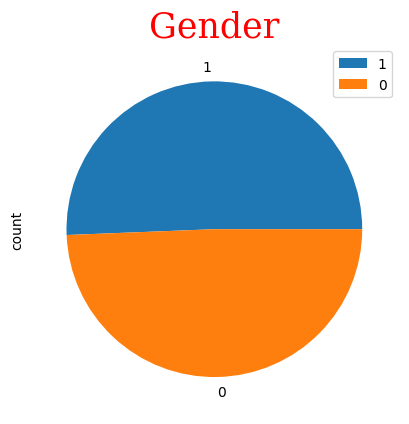

In [7]:
f={"family":"serif","size":25,"color":"r"}
plt.title("Gender",fontdict=f)
data["Gender"].value_counts().plot(kind="pie",legend=True)

<Axes: title={'center': 'Age vs. Ethnicity '}, ylabel='Frequency'>

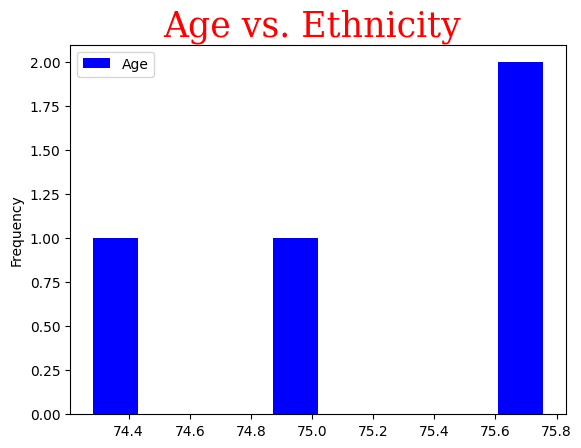

In [8]:
plt.title("Age vs. Ethnicity ",fontdict=f)
data.groupby(data["Ethnicity"])["Age"].mean().sort_values(ascending=True).plot(kind="hist",legend=True,color="b")

<Axes: title={'center': 'Gender VS. AlcoholConsumption '}, ylabel='Gender'>

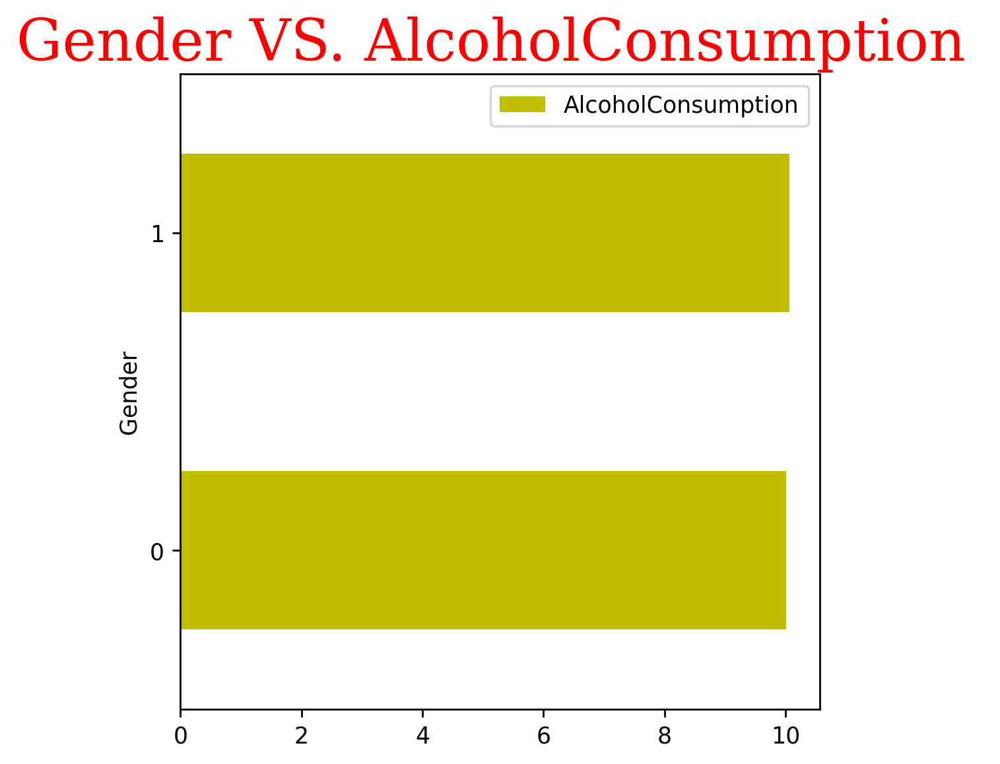

In [9]:
plt.figure(figsize=(5,5),dpi=250)
plt.title("Gender VS. AlcoholConsumption ",fontdict=f)
data.groupby(data["Gender"])["AlcoholConsumption"].mean().sort_values(ascending=True).plot(kind="barh",legend=True,color="y")

<Axes: title={'center': 'Number_Smoking (yes -->>1 ,No-->>0)'}, ylabel='count'>

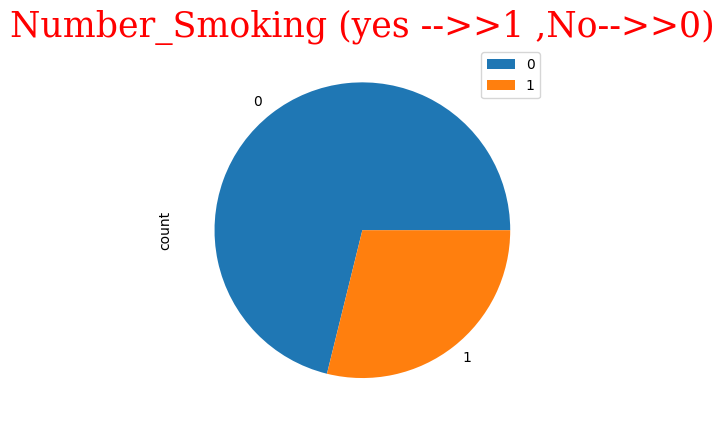

In [10]:
plt.title("Number_Smoking (yes -->>1 ,No-->>0)",fontdict=f)
data["Smoking"].value_counts().plot(kind="pie",legend=True)

<Axes: title={'center': 'represention for BMI rate & PhysicalActivity '}, xlabel='BMI', ylabel='Density'>

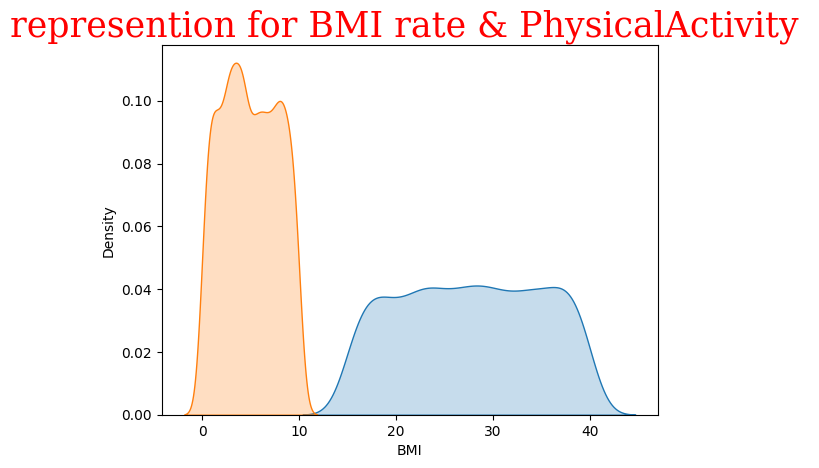

In [11]:
plt.title("represention for BMI rate & PhysicalActivity ",fontdict=f)
sns.kdeplot(data["BMI"],fill=True)
sns.kdeplot(data["PhysicalActivity"],fill=True)

/home/abdalrahman/.local/lib/python3.8/site-packages/seaborn/axisgrid.py:453: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


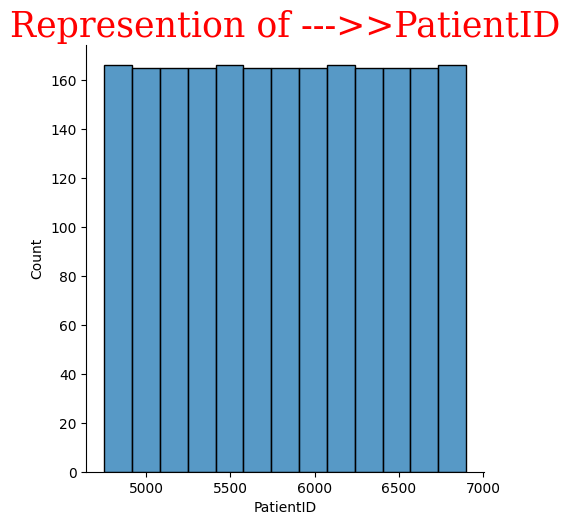

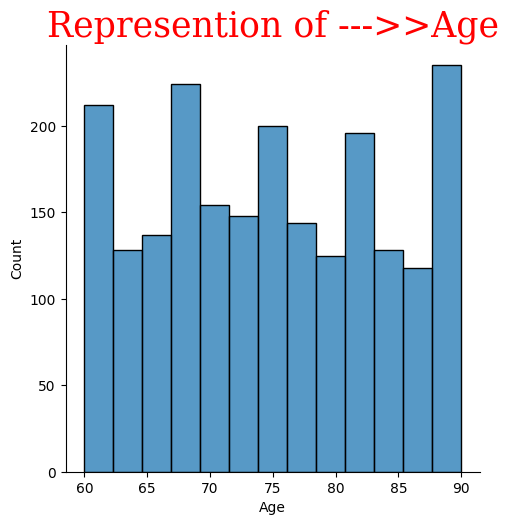

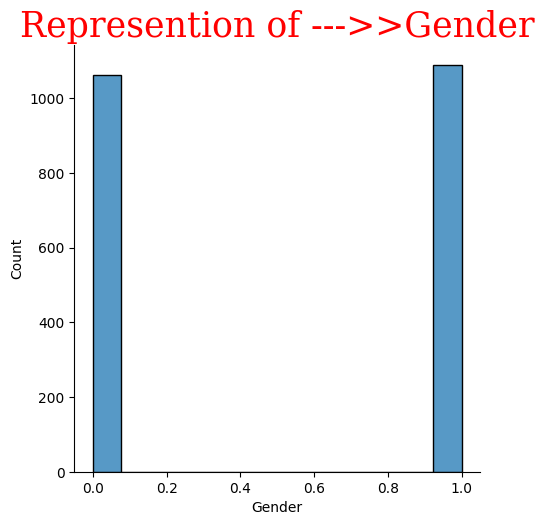

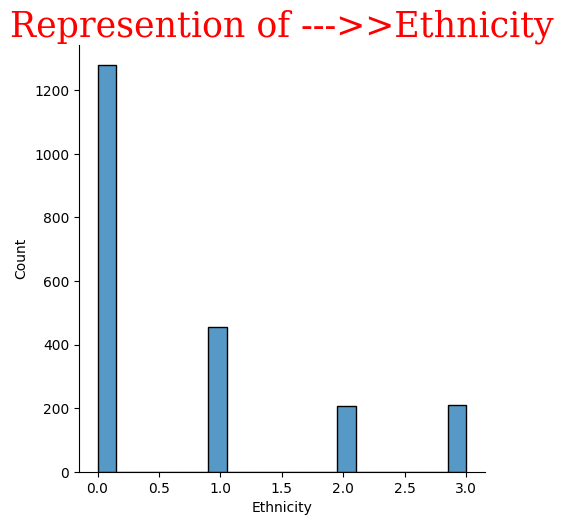

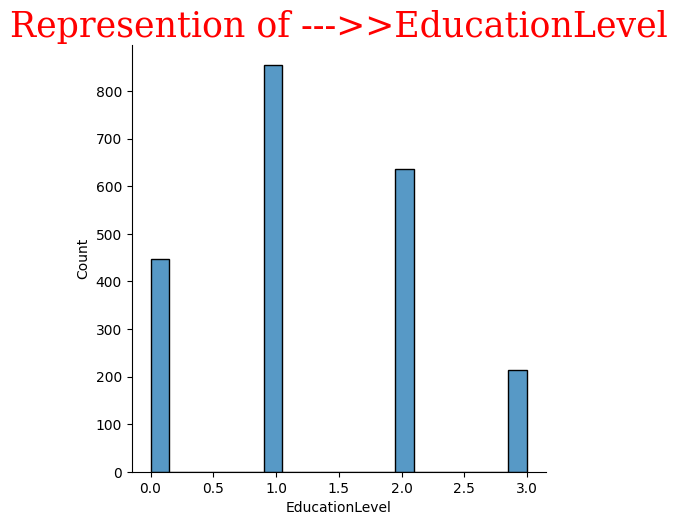

...

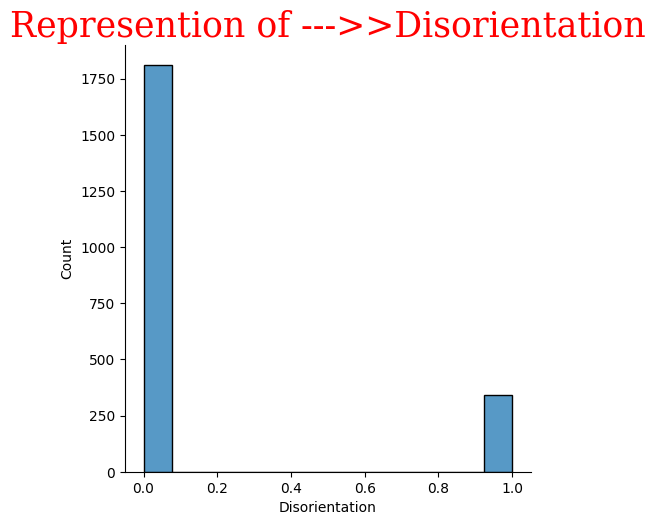

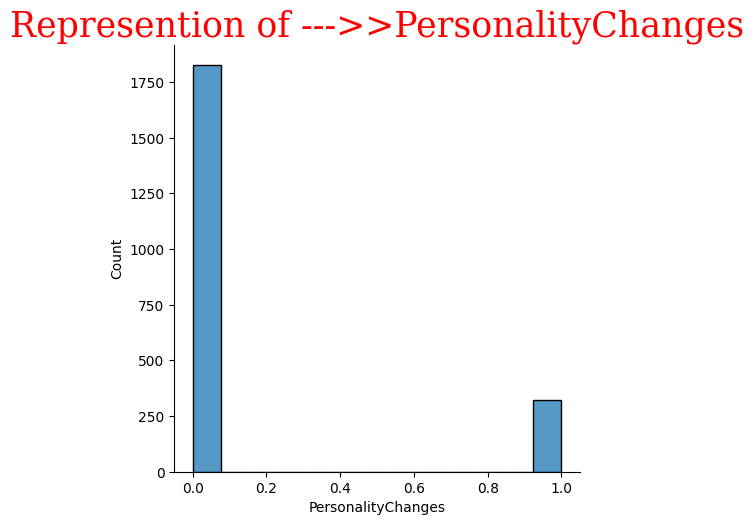

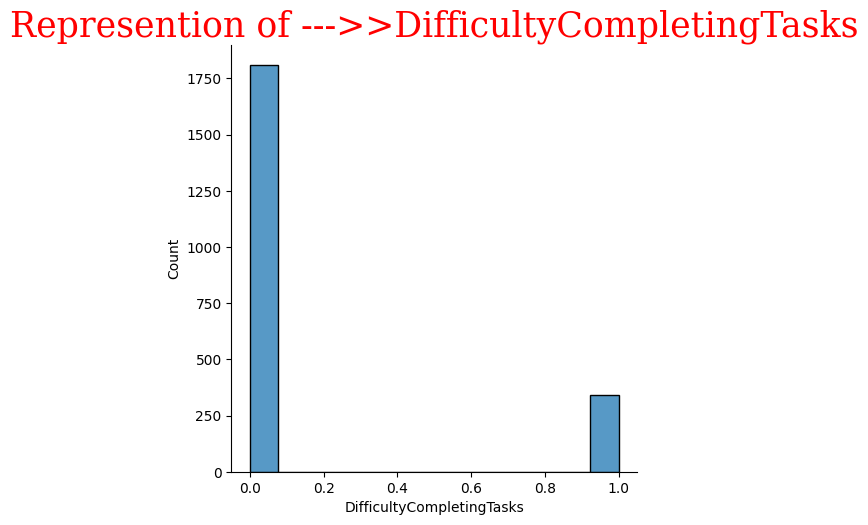

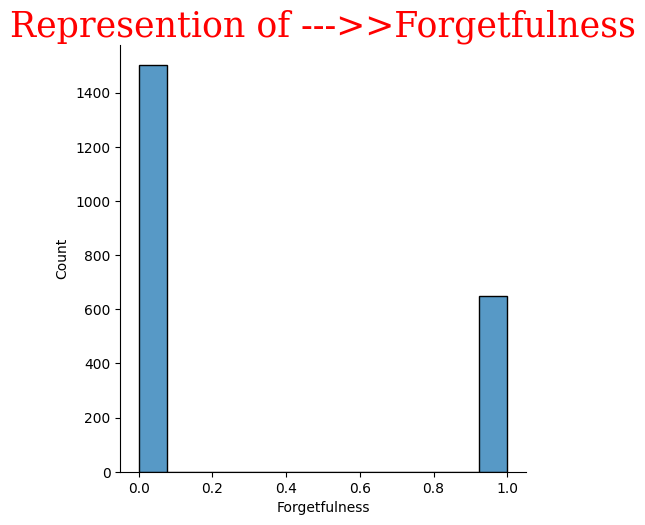

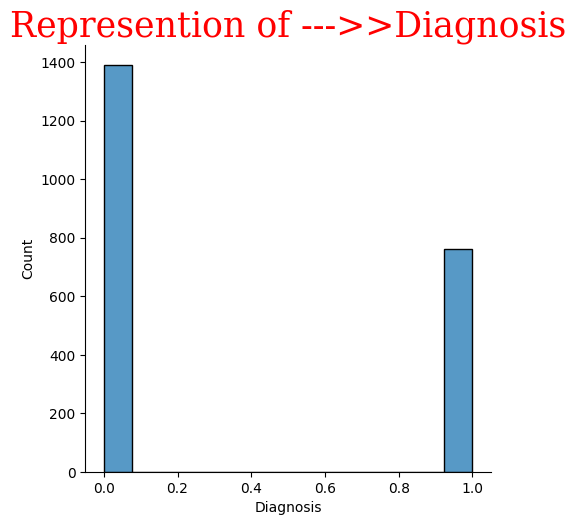

In [12]:
for col in data.select_dtypes(include="int64").columns:
    sns.displot(data[col])
    plt.title("Represention of --->>"+col,fontdict=f)

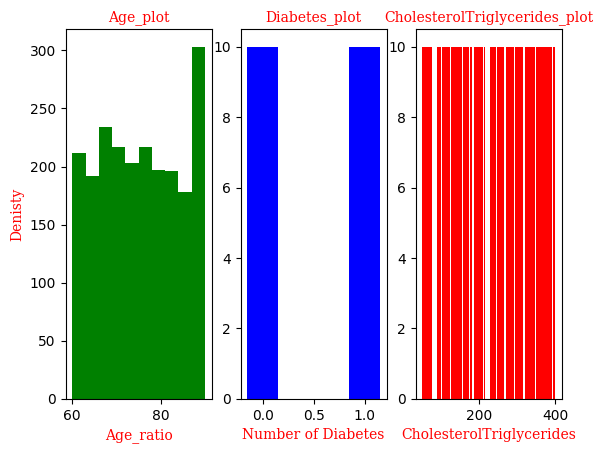

In [13]:
#We use the subplot when we want todraw 2 plots by the side :
f1={"family":"serif","size":10,"color":"r"}
# plot 1
x1 = data["Age"]


plt.subplot(1,3,1)
plt.hist(x1,color="g") # plot the data
plt.xlabel("Age_ratio",fontdict=f1)
plt.ylabel("Denisty",fontdict=f1)
plt.title("Age_plot",fontdict=f1)
plt.Figure(figsize=(100,120))
# plot 2:

x2 = data["Diabetes"]

plt.subplot(1,3,2)
plt.bar(x2,color="b",height=10,width=0.3)
plt.xlabel("Number of Diabetes",fontdict=f1)
plt.title("Diabetes_plot",fontdict=f1)
plt.Figure(figsize=(100,120))
#plot3:

x3=data["CholesterolTriglycerides"]
plt.subplot(1,3,3)
plt.bar(x3,width=0.3,height=10,color="r",align="center")
plt.xlabel("CholesterolTriglycerides",fontdict=f1)
plt.title("CholesterolTriglycerides_plot",fontdict=f1)
plt.Figure(figsize=(100,120))
plt.show()


<Figure size 7500x4500 with 0 Axes>

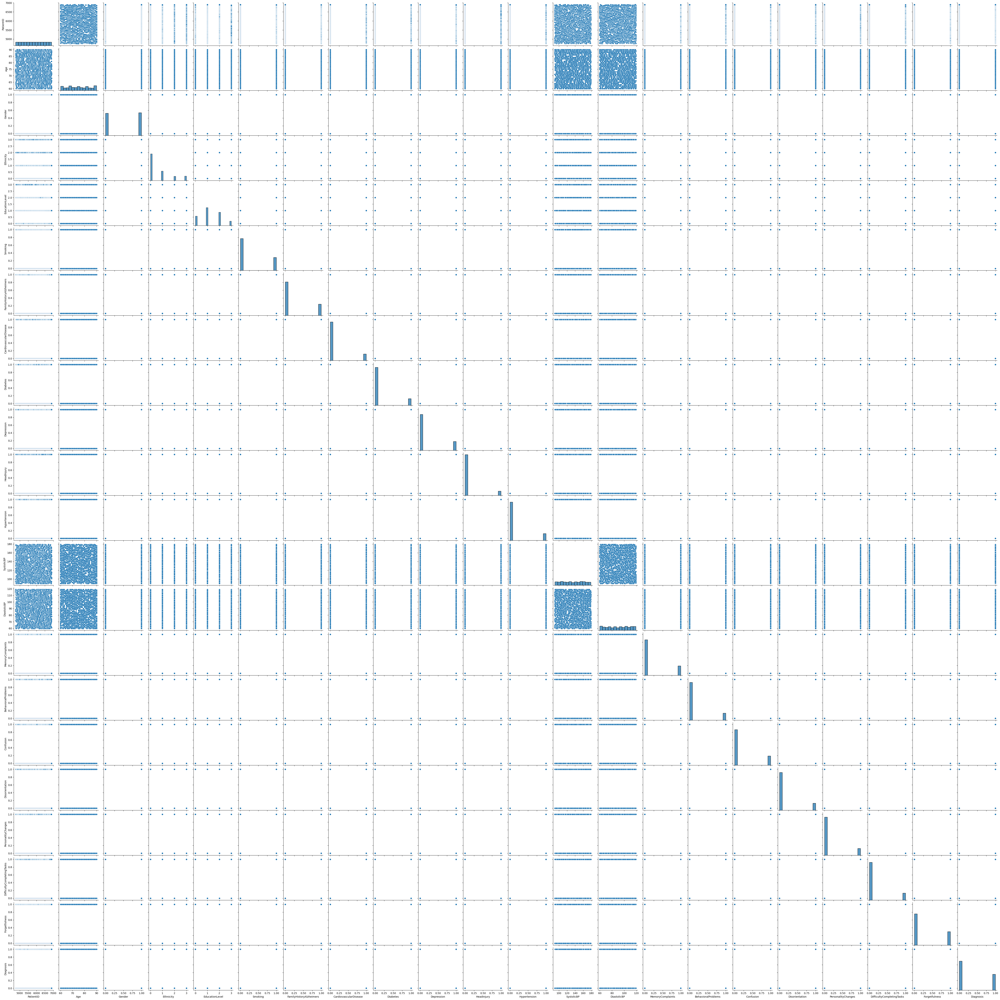

In [14]:
plt.figure(figsize=(25,15),dpi=300)
sns.pairplot(data.select_dtypes(include="int64"))

<Figure size 7500x4500 with 0 Axes>

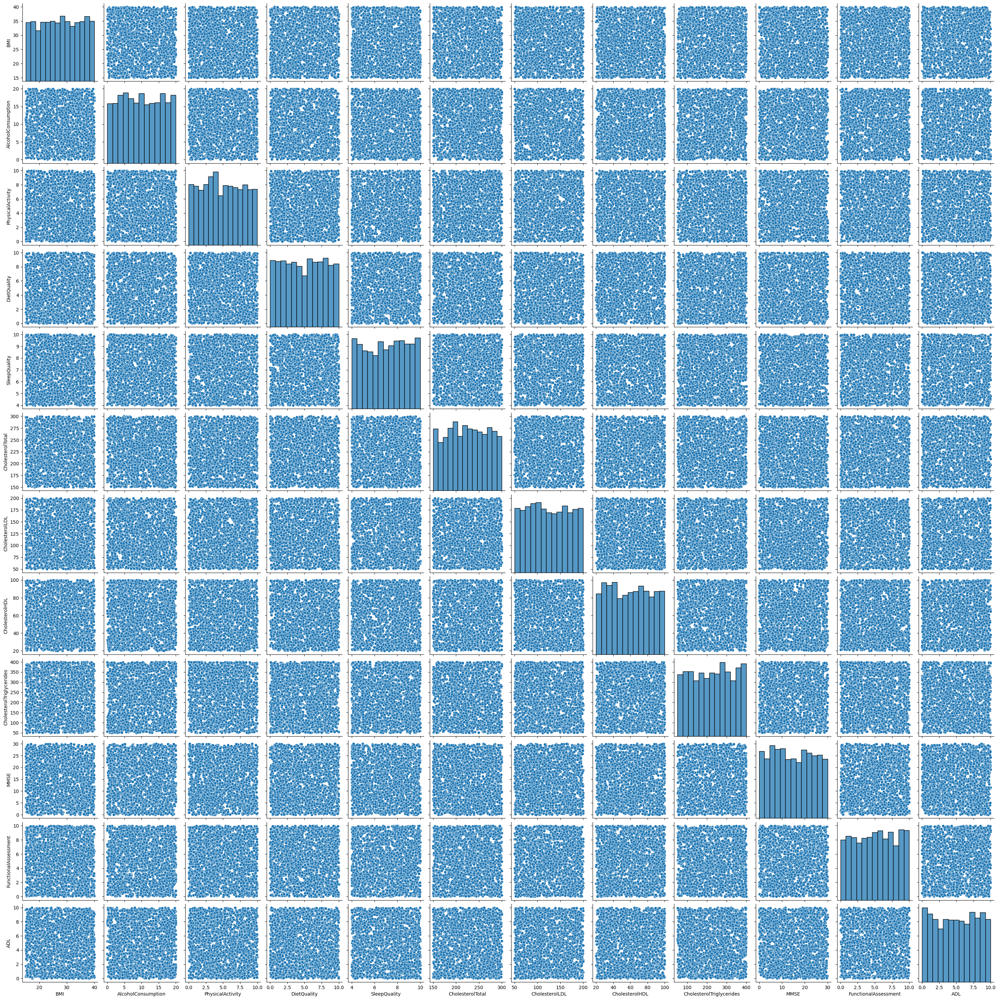

In [15]:
plt.figure(figsize=(25,15),dpi=300)
sns.pairplot(data.select_dtypes(include="float64"))

/home/abdalrahman/.local/lib/python3.8/site-packages/seaborn/axisgrid.py:1696: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  f = plt.figure(figsize=(height, height))


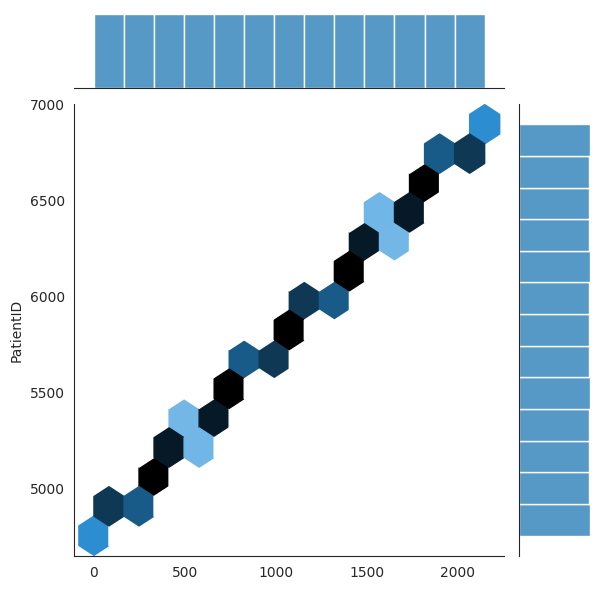

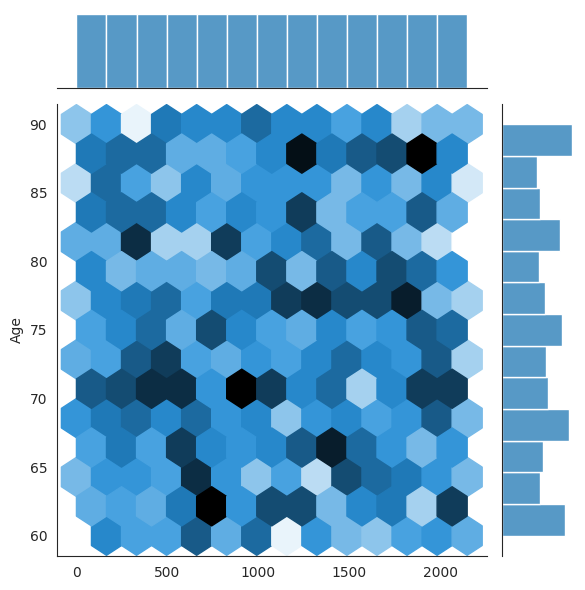

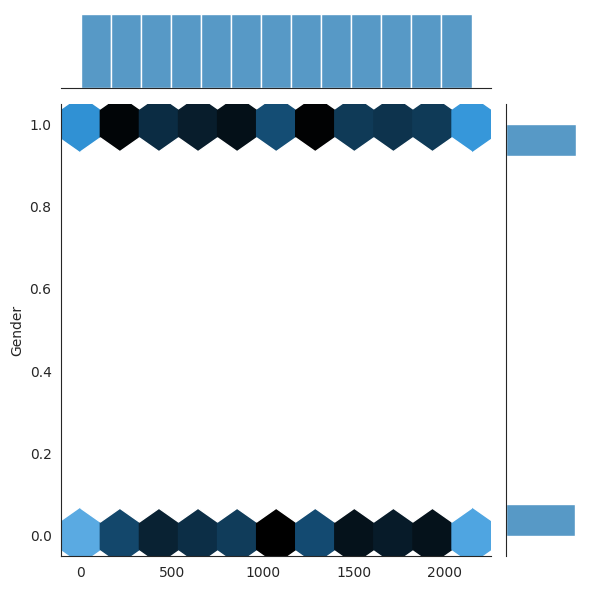

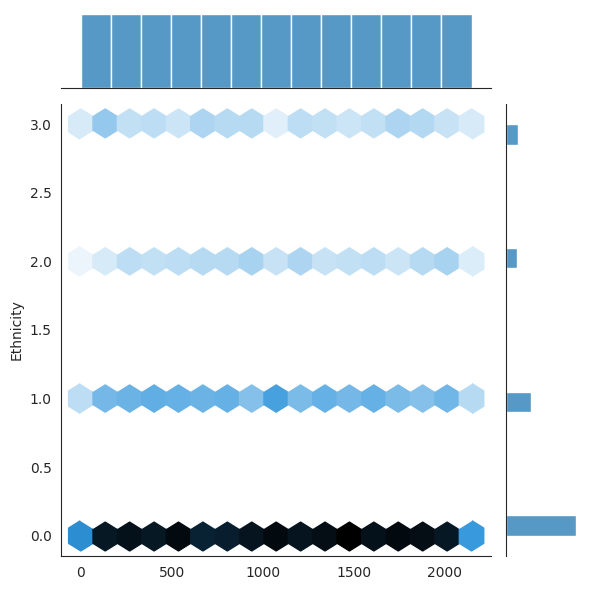

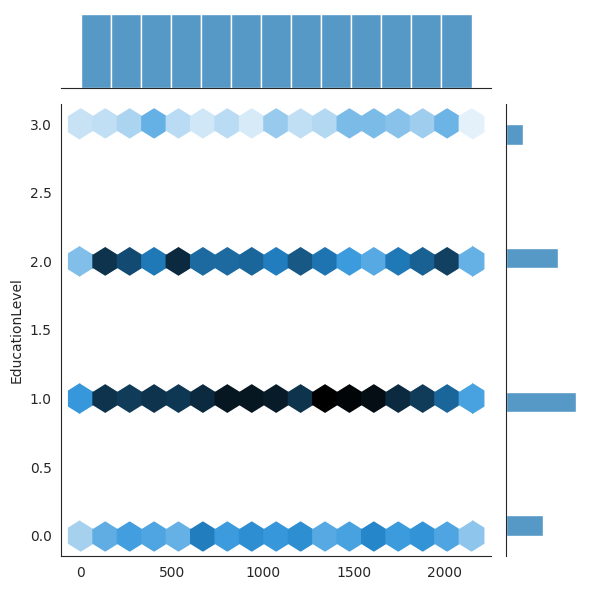

...

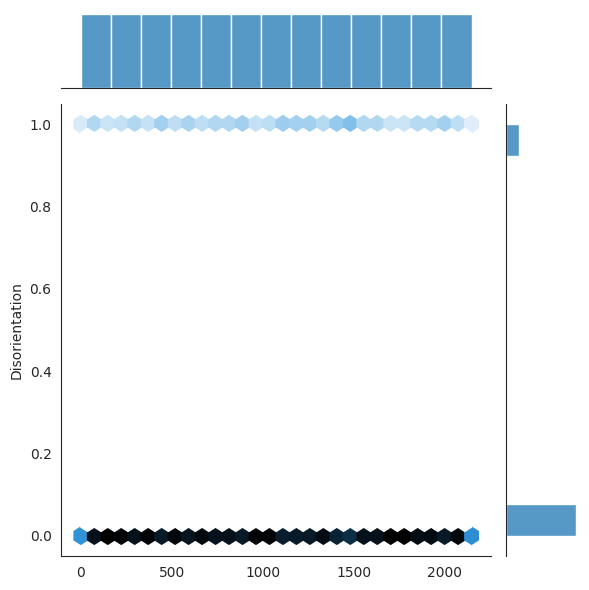

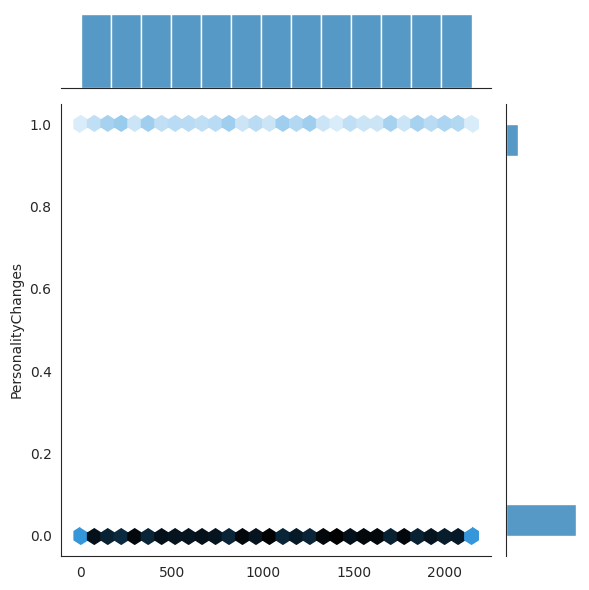

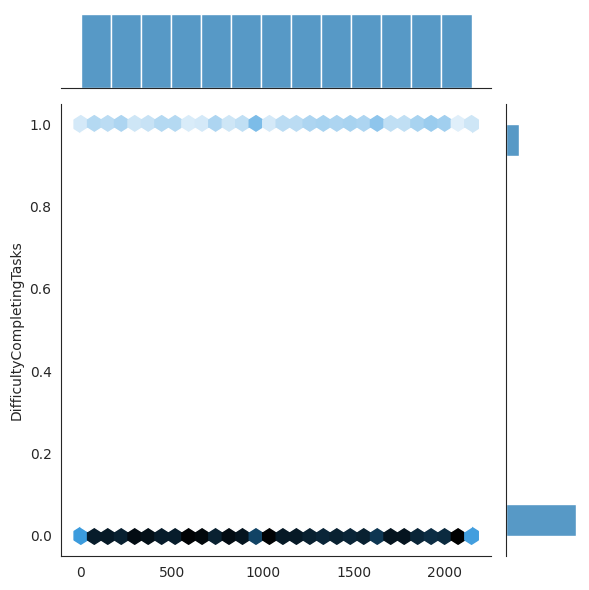

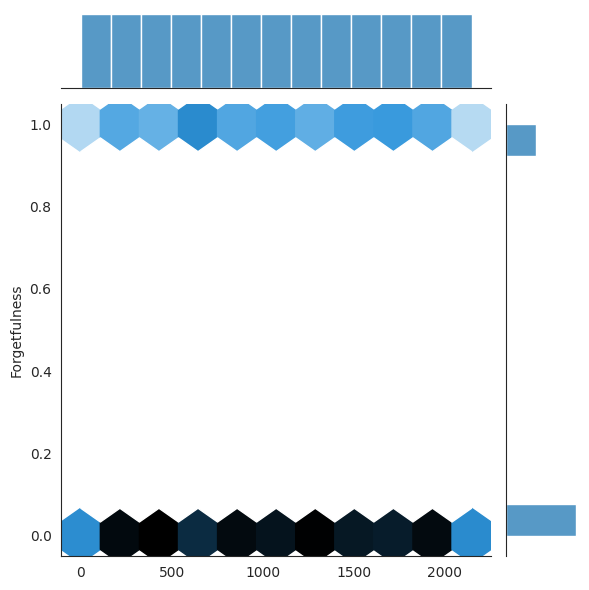

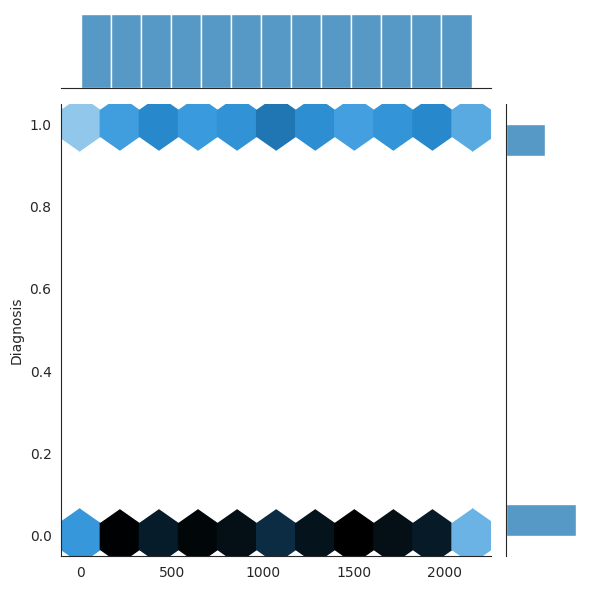

In [16]:
for col in data.select_dtypes(include="int64"):
    with sns.axes_style("white"):
        sns.jointplot(data[col],kind="hex")

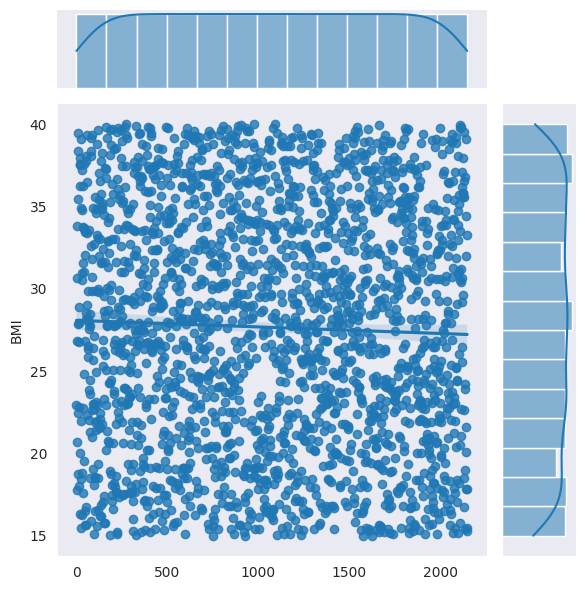

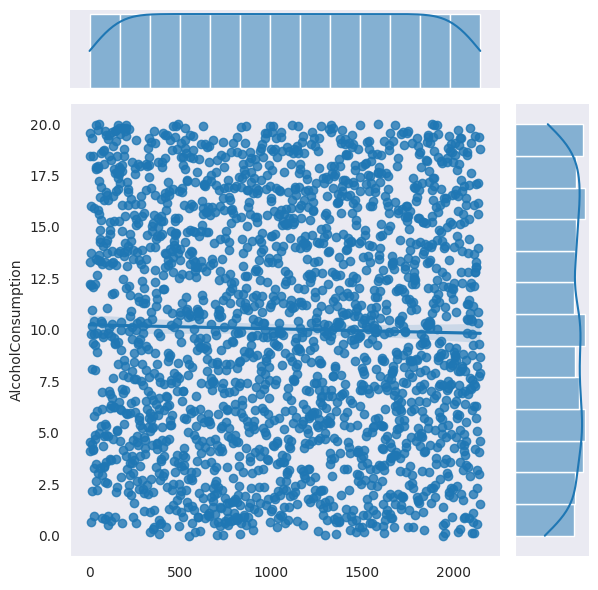

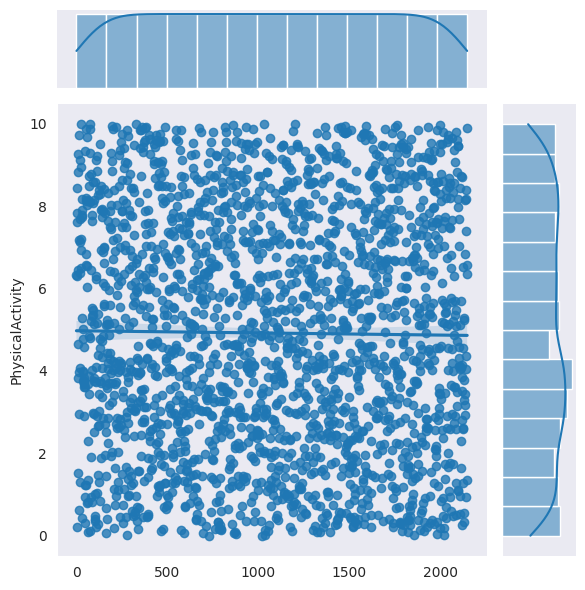

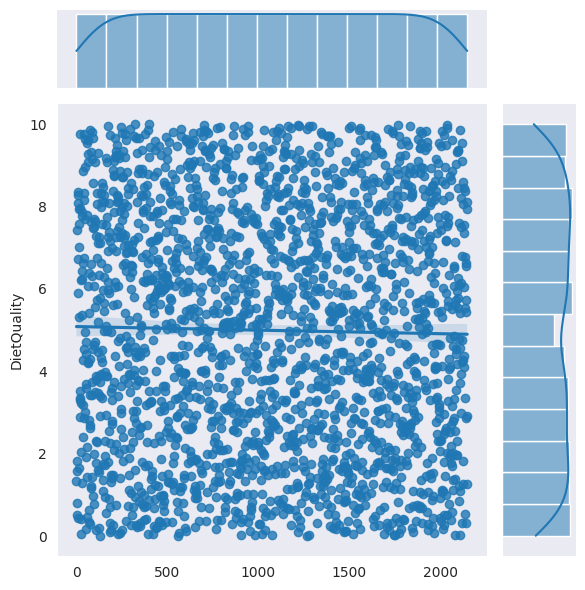

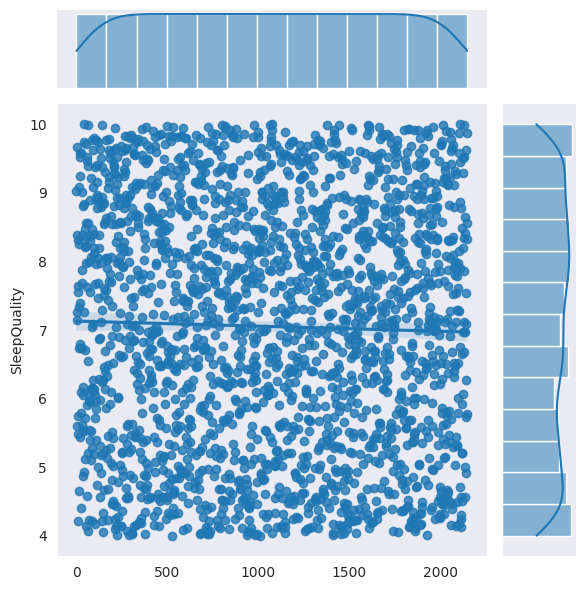

...

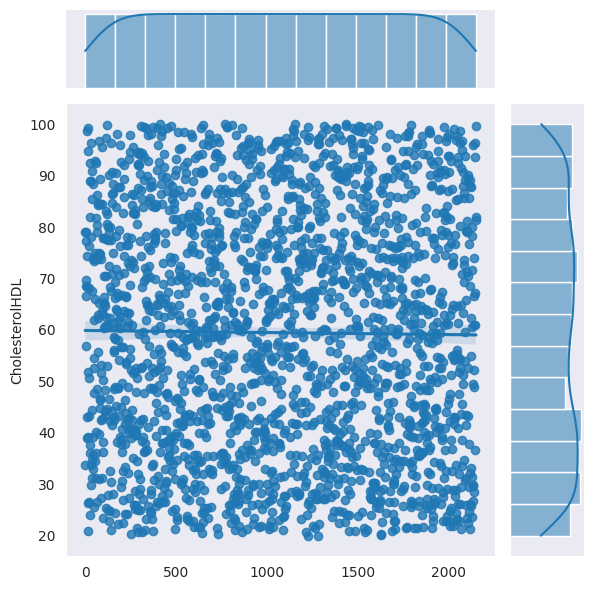

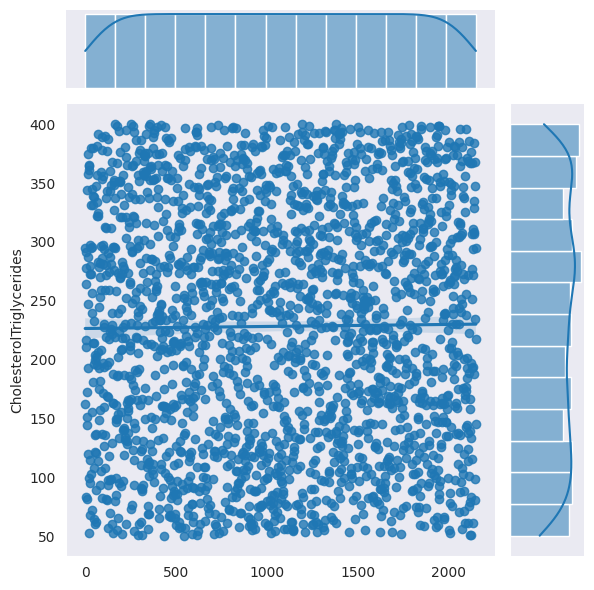

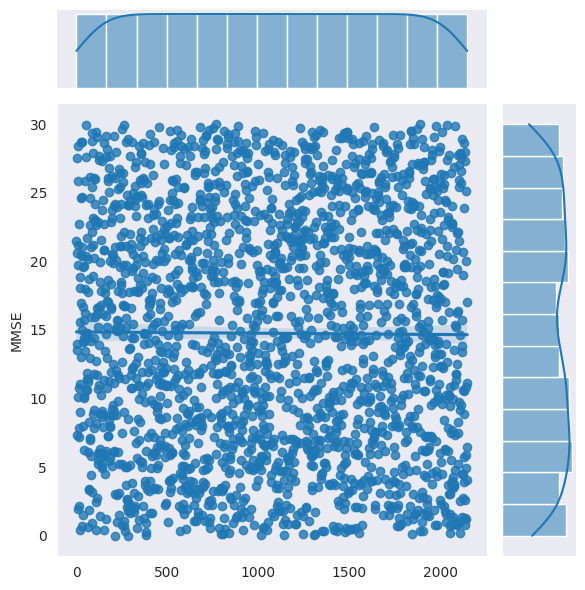

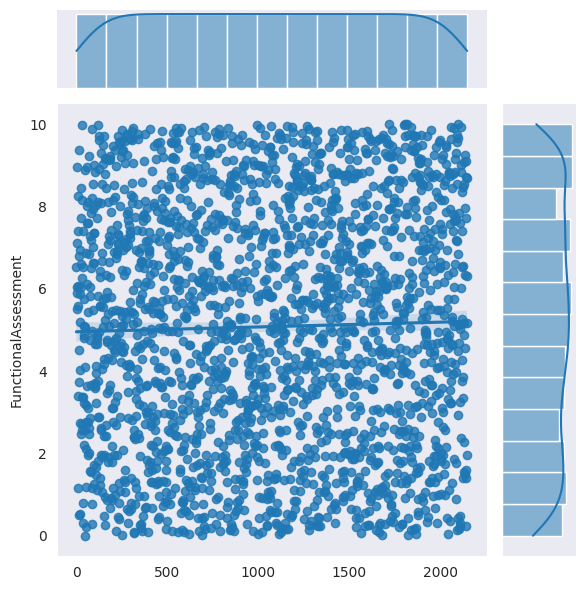

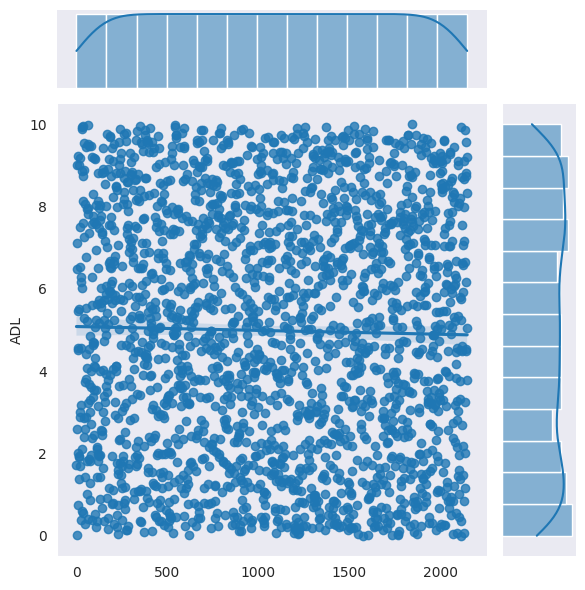

In [17]:
for col in data.select_dtypes(include="float64"):
    with sns.axes_style("dark"):
        sns.jointplot(data[col],kind="reg")

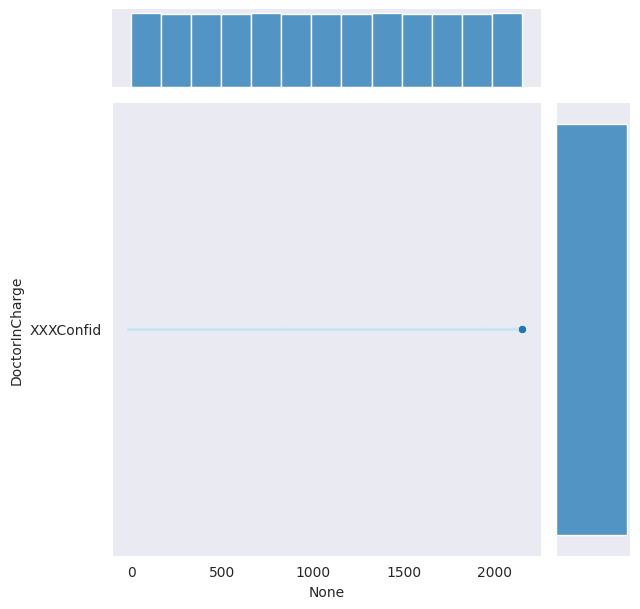

In [18]:
for col in data.select_dtypes("object"):
    with sns.axes_style("dark"):
        sns.jointplot(data[col],kind="scatter")

In [19]:
# VaraianceThreshold:
selector=VarianceThreshold(threshold=0.01)
selector.fit(data.select_dtypes("number"))

VarianceThreshold(threshold=0.01)

In [20]:
selector.get_support(indices=True)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33])

In [21]:
num_cols[selector.get_support(indices=True)]

Index(['PatientID', 'Age', 'Gender', 'Ethnicity', 'EducationLevel', 'BMI',
       'Smoking', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality',
       'SleepQuality', 'FamilyHistoryAlzheimers', 'CardiovascularDisease',
       'Diabetes', 'Depression', 'HeadInjury', 'Hypertension', 'SystolicBP',
       'DiastolicBP', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL',
       'CholesterolTriglycerides', 'MMSE', 'FunctionalAssessment',
       'MemoryComplaints', 'BehavioralProblems', 'ADL', 'Confusion',
       'Disorientation', 'PersonalityChanges', 'DifficultyCompletingTasks',
       'Forgetfulness', 'Diagnosis'],
      dtype='object')

In [22]:
class Var_Selector(BaseEstimator,TransformerMixin):
    
    def __init__(self,num_cols):
        self.num_cols=None
    def fit(self,data):
        self.num_cols=data.select_dtypes("number").columns
        return self
    def transform(self,data):
        selector=VarianceThreshold(threshold=0.01)
        selector.fit(data[self.num_cols])
        
        removed_cols=[column for column in self.num_cols if column not in \
                     self.num_cols[selector.get_support(indices=True)]]
        data=data.drop(columns=removed_cols)
        
        # remove high-low cardinality categorical:-
        
        removed_cols=data.nunique()[((data.nunique()==1)|data.nunique()==len(data))].index
        
        return data.drop(columns=removed_cols)
        

In [23]:
transform=Var_Selector(data)
transform.fit(data)
transform.transform(data)


,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,4751,73,0,0,2,22.927749,0,13.297218,6.327112,1.347214,...,0,0,1.725883,0,0,0,1,0,0,XXXConfid
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,XXXConfid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,6895,61,0,0,1,39.121757,0,1.561126,4.049964,6.555306,...,0,0,4.492838,1,0,0,0,0,1,XXXConfid
2145,6896,75,0,0,2,17.857903,0,18.767261,1.360667,2.904662,...,0,1,9.204952,0,0,0,0,0,1,XXXConfid
2146,6897,77,0,0,1,15.476479,0,4.594670,9.886002,8.120025,...,0,0,5.036334,0,0,0,0,0,1,XXXConfid
2147,6898,78,1,3,1,15.299911,0,8.674505,6.354282,1.263427,...,0,0,3.785399,0,0,0,0,1,1,XXXConfid


In [24]:
# Check if there are aduplicated values in the data:
df=data
duplicated_features=df.duplicated().sum()
print("Number of duplicates ----->>> ",duplicated_features)

Number of duplicates ----->>>  0


In [25]:
data.drop(duplicated_features)

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
1,4752,89,0,0,0,26.827681,0,4.542524,7.619885,0.518767,...,0,0,2.592424,0,0,0,0,1,0,XXXConfid
2,4753,73,0,3,1,17.795882,0,19.555085,7.844988,1.826335,...,0,0,7.119548,0,1,0,1,0,0,XXXConfid
3,4754,74,1,0,1,33.800817,1,12.209266,8.428001,7.435604,...,0,1,6.481226,0,0,0,0,0,0,XXXConfid
4,4755,89,0,0,0,20.716974,0,18.454356,6.310461,0.795498,...,0,0,0.014691,0,0,1,1,0,0,XXXConfid
5,4756,86,1,1,1,30.626886,0,4.140144,0.211062,1.584922,...,0,0,9.015686,1,0,0,0,0,0,XXXConfid
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,6895,61,0,0,1,39.121757,0,1.561126,4.049964,6.555306,...,0,0,4.492838,1,0,0,0,0,1,XXXConfid
2145,6896,75,0,0,2,17.857903,0,18.767261,1.360667,2.904662,...,0,1,9.204952,0,0,0,0,0,1,XXXConfid
2146,6897,77,0,0,1,15.476479,0,4.594670,9.886002,8.120025,...,0,0,5.036334,0,0,0,0,0,1,XXXConfid
2147,6898,78,1,3,1,15.299911,0,8.674505,6.354282,1.263427,...,0,0,3.785399,0,0,0,0,1,1,XXXConfid


In [26]:
correlation=data.select_dtypes("number").corr()
correlation

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
PatientID,1.000000,0.002947,-0.043665,-0.007608,-0.001729,-0.034228,0.021907,-0.020733,-0.011424,-0.018490,...,0.025033,0.005748,-0.033700,-0.019787,0.004430,0.010772,-0.011987,0.029727,0.001448,0.041019
Age,0.002947,1.000000,0.028708,0.027745,-0.060560,-0.015677,0.020060,0.007323,-0.010249,-0.023386,...,0.005508,0.012343,0.038973,-0.038658,0.009002,0.027523,-0.009470,0.013900,-0.019279,-0.005488
Gender,-0.043665,0.028708,1.000000,-0.003660,-0.007070,0.005928,0.016650,0.004330,-0.035795,0.010942,...,0.033324,0.003880,0.006099,0.003865,-0.030583,0.017506,0.025919,-0.001636,-0.028537,-0.020975
Ethnicity,-0.007608,0.027745,-0.003660,1.000000,0.026516,-0.003176,0.031485,0.008363,0.020498,-0.018184,...,-0.004704,0.003687,-0.019363,0.010475,0.022431,-0.018132,-0.030035,0.019363,-0.034619,-0.014782
EducationLevel,-0.001729,-0.060560,-0.007070,0.026516,1.000000,-0.023514,-0.009904,-0.012646,-0.016703,0.017412,...,0.020269,-0.000165,0.010473,0.031934,-0.008168,-0.017568,-0.019950,0.013033,-0.008685,-0.043966
BMI,-0.034228,-0.015677,0.005928,-0.003176,-0.023514,1.000000,0.020437,-0.008997,0.000742,0.019922,...,-0.030501,0.029293,0.035276,-0.009788,-0.015859,-0.031840,-0.015901,-0.039400,0.071131,0.026343
Smoking,0.021907,0.020060,0.016650,0.031485,-0.009904,0.020437,1.000000,0.008363,0.010760,-0.002048,...,-0.031879,0.020339,-0.014763,-0.029233,0.004498,-0.028403,-0.009977,0.001741,0.018011,-0.004865
AlcoholConsumption,-0.020733,0.007323,0.004330,0.008363,-0.012646,-0.008997,0.008363,1.000000,0.021696,0.020117,...,-0.016483,-0.029418,0.013657,-0.008250,-0.032798,0.015521,0.019117,-0.002712,-0.024121,-0.007618
PhysicalActivity,-0.011424,-0.010249,-0.035795,0.020498,-0.016703,0.000742,0.010760,0.021696,1.000000,0.011085,...,-0.002419,0.008709,-0.014253,-0.013324,-0.009397,-0.020407,-0.013629,0.031169,0.009837,0.005945
DietQuality,-0.018490,-0.023386,0.010942,-0.018184,0.017412,0.019922,-0.002048,0.020117,0.011085,1.000000,...,-0.009700,0.012537,-0.014033,-0.007888,0.002628,-0.026271,0.029087,0.045737,0.006175,0.008506


In [27]:
# 1st way : Spearman :
correlation=data.select_dtypes("number").corr(method="spearman")
correlation


,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
PatientID,1.000000,0.002944,-0.043665,-0.006729,-0.007179,-0.034357,0.021907,-0.020008,-0.011835,-0.018185,...,0.025237,0.005748,-0.033700,-0.020523,0.004430,0.010772,-0.011987,0.029727,0.001448,0.041019
Age,0.002944,1.000000,0.029354,0.017615,-0.064524,-0.016253,0.020025,0.007963,-0.010820,-0.023727,...,0.005253,0.012046,0.038571,-0.038119,0.008857,0.027837,-0.009921,0.013990,-0.019184,-0.005731
Gender,-0.043665,0.029354,1.000000,-0.000057,-0.006058,0.005632,0.016650,0.003877,-0.035355,0.011159,...,0.032498,0.003880,0.006099,0.004523,-0.030583,0.017506,0.025919,-0.001636,-0.028537,-0.020975
Ethnicity,-0.006729,0.017615,-0.000057,1.000000,0.034580,-0.008008,0.016721,0.008429,0.021505,-0.021589,...,-0.004355,0.002757,-0.018437,0.014190,0.029636,-0.013147,-0.027070,0.029412,-0.030626,-0.017744
EducationLevel,-0.007179,-0.064524,-0.006058,0.034580,1.000000,-0.025187,-0.010235,-0.010717,-0.013843,0.014493,...,0.022713,0.000414,0.014308,0.035168,-0.008529,-0.018749,-0.018701,0.013018,-0.008009,-0.043325
BMI,-0.034357,-0.016253,0.005632,-0.008008,-0.025187,1.000000,0.020500,-0.009254,0.000165,0.019772,...,-0.030683,0.029268,0.035909,-0.009601,-0.015533,-0.031865,-0.016018,-0.039228,0.071140,0.026402
Smoking,0.021907,0.020025,0.016650,0.016721,-0.010235,0.020500,1.000000,0.008576,0.010442,-0.002407,...,-0.032167,0.020339,-0.014763,-0.028855,0.004498,-0.028403,-0.009977,0.001741,0.018011,-0.004865
AlcoholConsumption,-0.020008,0.007963,0.003877,0.008429,-0.010717,-0.009254,0.008576,1.000000,0.022713,0.020412,...,-0.015872,-0.029919,0.013348,-0.007409,-0.033499,0.015827,0.019118,-0.002839,-0.024917,-0.008631
PhysicalActivity,-0.011835,-0.010820,-0.035355,0.021505,-0.013843,0.000165,0.010442,0.022713,1.000000,0.010632,...,-0.001285,0.009109,-0.013860,-0.013931,-0.008726,-0.020324,-0.013842,0.030572,0.010961,0.005866
DietQuality,-0.018185,-0.023727,0.011159,-0.021589,0.014493,0.019772,-0.002407,0.020412,0.010632,1.000000,...,-0.008855,0.012556,-0.013827,-0.008662,0.003000,-0.026463,0.029843,0.045183,0.006271,0.008670


In [28]:
# 2nd way kendall:

correlation=data.select_dtypes("number").corr(method="kendall")
correlation


,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
PatientID,1.000000,0.001447,-0.035661,-0.005250,-0.005914,-0.023028,0.017891,-0.013283,-0.008288,-0.012257,...,0.016949,0.004694,-0.027523,-0.013786,0.003618,0.008798,-0.009789,0.024277,0.001183,0.033500
Age,0.001447,1.000000,0.024357,0.013778,-0.049524,-0.010915,0.016616,0.005444,-0.007234,-0.015925,...,0.003447,0.009995,0.032004,-0.025825,0.007349,0.023098,-0.008232,0.011609,-0.015918,-0.004755
Gender,-0.035661,0.024357,1.000000,-0.000054,-0.005606,0.004600,0.016650,0.003166,-0.028874,0.009114,...,0.026541,0.003880,0.006099,0.003694,-0.030583,0.017506,0.025919,-0.001636,-0.028537,-0.020975
Ethnicity,-0.005250,0.013778,-0.000054,1.000000,0.030243,-0.006217,0.015778,0.006428,0.016624,-0.016875,...,-0.003357,0.002601,-0.017396,0.010852,0.027964,-0.012405,-0.025542,0.027752,-0.028898,-0.016743
EducationLevel,-0.005914,-0.049524,-0.005606,0.030243,1.000000,-0.018943,-0.009473,-0.008181,-0.010527,0.010822,...,0.017548,0.000383,0.013242,0.026419,-0.007894,-0.017352,-0.017308,0.012048,-0.007412,-0.040097
BMI,-0.023028,-0.010915,0.004600,-0.006217,-0.018943,1.000000,0.016742,-0.006212,-0.000105,0.013044,...,-0.020765,0.023903,0.029327,-0.006418,-0.012686,-0.026024,-0.013081,-0.032037,0.058099,0.021562
Smoking,0.017891,0.016616,0.016650,0.015778,-0.009473,0.016742,1.000000,0.007004,0.008528,-0.001966,...,-0.026270,0.020339,-0.014763,-0.023566,0.004498,-0.028403,-0.009977,0.001741,0.018011,-0.004865
AlcoholConsumption,-0.013283,0.005444,0.003166,0.006428,-0.008181,-0.006212,0.007004,1.000000,0.015278,0.013229,...,-0.010202,-0.024434,0.010902,-0.004876,-0.027358,0.012925,0.015614,-0.002319,-0.020350,-0.007048
PhysicalActivity,-0.008288,-0.007234,-0.028874,0.016624,-0.010527,-0.000105,0.008528,0.015278,1.000000,0.007184,...,-0.000758,0.007439,-0.011319,-0.009015,-0.007126,-0.016598,-0.011304,0.024968,0.008951,0.004791
DietQuality,-0.012257,-0.015925,0.009114,-0.016875,0.010822,0.013044,-0.001966,0.013229,0.007184,1.000000,...,-0.006358,0.010254,-0.011292,-0.005916,0.002450,-0.021612,0.024372,0.036901,0.005122,0.007080


In [29]:
# 3rth way : pearson 

correlation=data.select_dtypes("number").corr(method="pearson")
correlation


,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,FunctionalAssessment,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis
PatientID,1.000000,0.002947,-0.043665,-0.007608,-0.001729,-0.034228,0.021907,-0.020733,-0.011424,-0.018490,...,0.025033,0.005748,-0.033700,-0.019787,0.004430,0.010772,-0.011987,0.029727,0.001448,0.041019
Age,0.002947,1.000000,0.028708,0.027745,-0.060560,-0.015677,0.020060,0.007323,-0.010249,-0.023386,...,0.005508,0.012343,0.038973,-0.038658,0.009002,0.027523,-0.009470,0.013900,-0.019279,-0.005488
Gender,-0.043665,0.028708,1.000000,-0.003660,-0.007070,0.005928,0.016650,0.004330,-0.035795,0.010942,...,0.033324,0.003880,0.006099,0.003865,-0.030583,0.017506,0.025919,-0.001636,-0.028537,-0.020975
Ethnicity,-0.007608,0.027745,-0.003660,1.000000,0.026516,-0.003176,0.031485,0.008363,0.020498,-0.018184,...,-0.004704,0.003687,-0.019363,0.010475,0.022431,-0.018132,-0.030035,0.019363,-0.034619,-0.014782
EducationLevel,-0.001729,-0.060560,-0.007070,0.026516,1.000000,-0.023514,-0.009904,-0.012646,-0.016703,0.017412,...,0.020269,-0.000165,0.010473,0.031934,-0.008168,-0.017568,-0.019950,0.013033,-0.008685,-0.043966
BMI,-0.034228,-0.015677,0.005928,-0.003176,-0.023514,1.000000,0.020437,-0.008997,0.000742,0.019922,...,-0.030501,0.029293,0.035276,-0.009788,-0.015859,-0.031840,-0.015901,-0.039400,0.071131,0.026343
Smoking,0.021907,0.020060,0.016650,0.031485,-0.009904,0.020437,1.000000,0.008363,0.010760,-0.002048,...,-0.031879,0.020339,-0.014763,-0.029233,0.004498,-0.028403,-0.009977,0.001741,0.018011,-0.004865
AlcoholConsumption,-0.020733,0.007323,0.004330,0.008363,-0.012646,-0.008997,0.008363,1.000000,0.021696,0.020117,...,-0.016483,-0.029418,0.013657,-0.008250,-0.032798,0.015521,0.019117,-0.002712,-0.024121,-0.007618
PhysicalActivity,-0.011424,-0.010249,-0.035795,0.020498,-0.016703,0.000742,0.010760,0.021696,1.000000,0.011085,...,-0.002419,0.008709,-0.014253,-0.013324,-0.009397,-0.020407,-0.013629,0.031169,0.009837,0.005945
DietQuality,-0.018490,-0.023386,0.010942,-0.018184,0.017412,0.019922,-0.002048,0.020117,0.011085,1.000000,...,-0.009700,0.012537,-0.014033,-0.007888,0.002628,-0.026271,0.029087,0.045737,0.006175,0.008506


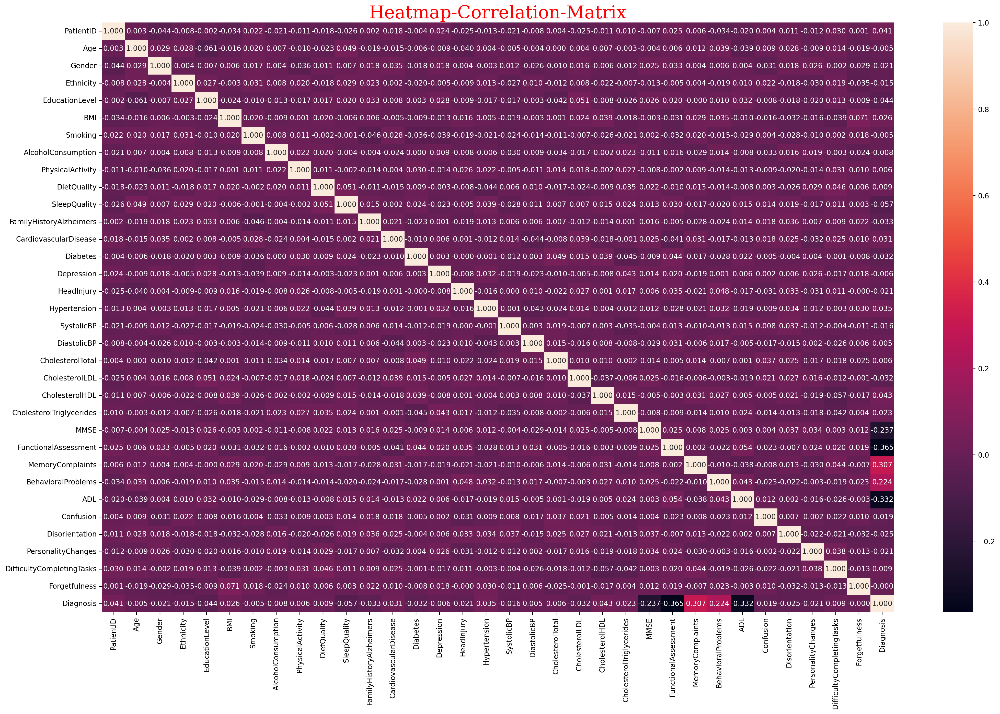

In [30]:
#plot the heatmap matrix :
plt.figure(figsize=(25,15),dpi=200)
plt.title("Heatmap-Correlation-Matrix",fontdict=f)
sns.heatmap(data.select_dtypes("number").corr(),annot=True,fmt="0.3f")
plt.show()

In [31]:
# Extract the most important Numerical Features:

fs=SelectKBest(score_func=f_classif,k=10)
fs.fit(data.drop(columns="Diagnosis").select_dtypes("number").fillna(0),data["Diagnosis"])

SelectKBest(k=3)

In [32]:
print(["{:10f}".format(p) for p in  fs.pvalues_])

['  0.057273', '  0.799279', '  0.331114', '  0.493403', '  0.041556', '  0.222206', '  0.821661', '  0.724127', '  0.782980', '  0.693520', '  0.008742', '  0.127342', '  0.144478', '  0.144257', '  0.784836', '  0.321143', '  0.103999', '  0.469371', '  0.806291', '  0.767031', '  0.138386', '  0.048401', '  0.293474', '  0.000000', '  0.000000', '  0.000000', '  0.000000', '  0.000000', '  0.374023', '  0.253400', '  0.339184', '  0.674369', '  0.986904']


In [33]:
print(["{:10f}".format(p) for p in fs.scores_])


['  3.618540', '  0.064675', '  0.944964', '  0.469257', '  4.158180', '  1.490932', '  0.050822', '  0.124605', '  0.075885', '  0.155343', '  6.887456', '  2.326417', '  2.131155', '  2.133507', '  0.074560', '  0.984742', '  2.645373', '  0.523642', '  0.060144', '  0.087793', '  2.197454', '  3.900444', '  1.104156', '127.915191', '329.785969', '222.994948', '113.792711', '266.590232', '  0.790584', '  1.305163', '  0.913921', '  0.176582', '  0.000269']


In [34]:
featurs_values=pd.DataFrame(fs.pvalues_)
features_scores=pd.DataFrame(fs.scores_)
features=pd.DataFrame(data.drop(columns="Diagnosis").select_dtypes("number").fillna(0).columns)


In [35]:
feature_score=pd.concat([featurs_values,features_scores,features],axis=1)
feature_score.columns=["pvalues","score","input"]
feature_score

,pvalues,score,input
0,5.727270e-02,3.618540,PatientID
1,7.992790e-01,0.064675,Age
2,3.311141e-01,0.944964,Gender
3,4.934032e-01,0.469257,Ethnicity
4,4.155613e-02,4.158180,EducationLevel
5,2.222060e-01,1.490932,BMI
6,8.216609e-01,0.050822,Smoking
7,7.241273e-01,0.124605,AlcoholConsumption
8,7.829796e-01,0.075885,PhysicalActivity
9,6.935202e-01,0.155343,DietQuality


In [36]:
# Extract the most important Categorical Features :
from sklearn.feature_selection import mutual_info_classif

mic=SelectKBest(score_func=mutual_info_classif,k=10)
mic.fit(data.drop(columns="Diagnosis").select_dtypes("number").fillna(0),data["Diagnosis"])

features_MI_scores=pd.Series(mic.scores_,index=data.drop(columns="Diagnosis").select_dtypes("number").fillna(0).columns)
features_MI_scores.sort_values(ascending=True)

Hypertension                 0.000000
DifficultyCompletingTasks    0.000000
HeadInjury                   0.000000
CholesterolLDL               0.000000
FamilyHistoryAlzheimers      0.000000
CholesterolTriglycerides     0.000000
SystolicBP                   0.000000
DietQuality                  0.000000
Smoking                      0.000000
BMI                          0.000000
Gender                       0.000000
Age                          0.000000
DiastolicBP                  0.000000
CholesterolTotal             0.000338
EducationLevel               0.005485
Disorientation               0.005638
CardiovascularDisease        0.006356
PersonalityChanges           0.007302
PhysicalActivity             0.007947
Forgetfulness                0.008002
Ethnicity                    0.008435
SleepQuality                 0.009691
Diabetes                     0.010184
BehavioralProblems           0.010909
Confusion                    0.014204
CholesterolHDL               0.017349
PatientID   

<Axes: ylabel='Ethnicity'>

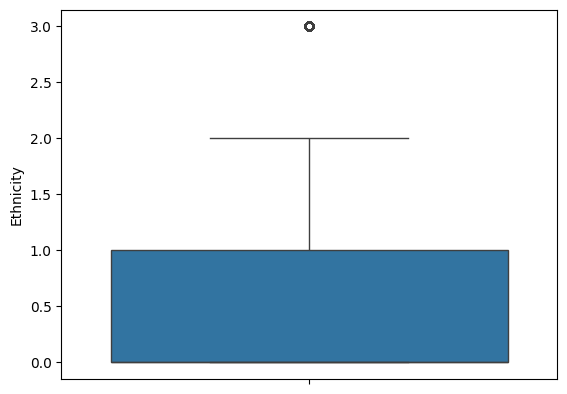

In [37]:
# Handling the outliers : 
# there are ouliers in Ethnicity ,Smoking , MemoryComplaints	

#1- Detect the outliers by using the boxplot to see if there the outliers :

sns.boxplot(data["Ethnicity"]) #from out of thes cell we found there outlier in this feature
   

<Axes: xlabel='Ethnicity'>

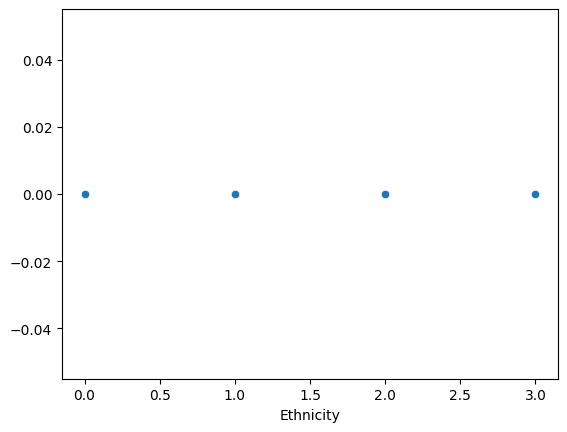

In [38]:
#2- by using the scatterplot:
sns.scatterplot(x=data["Ethnicity"],y=np.zeros_like(data["Ethnicity"]))

<Axes: ylabel='Smoking'>

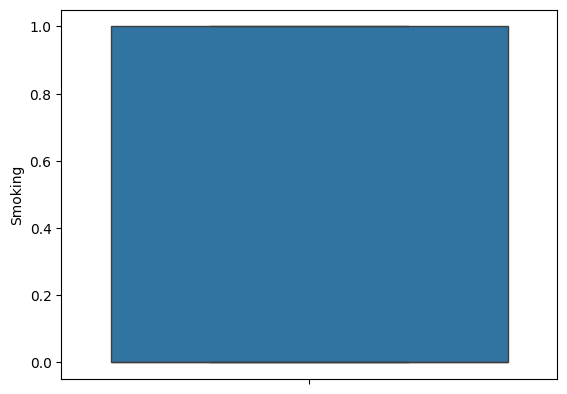

In [39]:
sns.boxplot(data["Smoking"])  # there outlier

<Axes: xlabel='Smoking'>

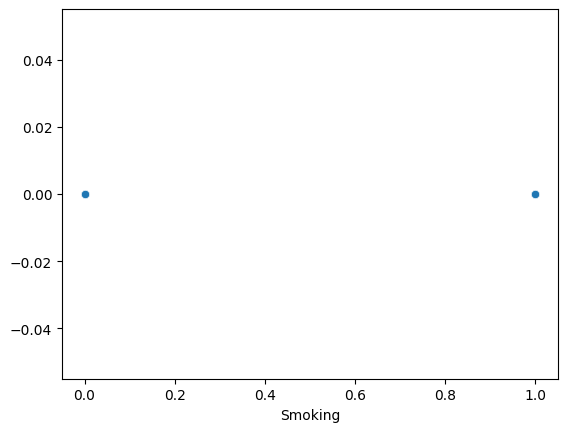

In [40]:
sns.scatterplot(x=data["Smoking"],y=np.zeros_like(data["Smoking"]))

<Axes: ylabel='MemoryComplaints'>

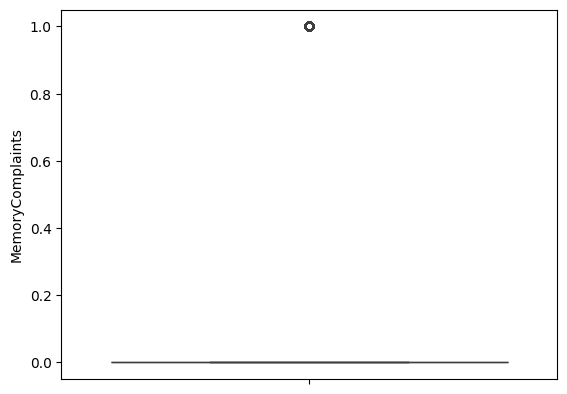

In [41]:
sns.boxplot(data["MemoryComplaints"]) # there outliers

<Axes: xlabel='MemoryComplaints'>

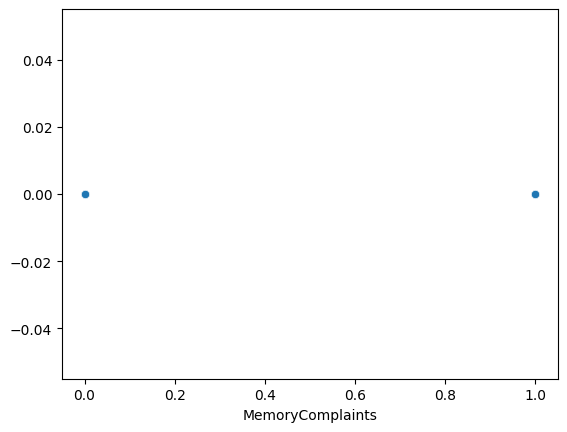

In [42]:
sns.scatterplot(x=data["MemoryComplaints"],y=np.zeros_like(data["MemoryComplaints"]))

In [43]:
# Handle the outliers  by cal: on the MemoryComplaints feature:
#calc Q1,Q2,Q3,IQR and detect the outliers:
#calc the lower & upper limits :

Q1_MemoryComplaints,Q3_MemoryComplaints=data["MemoryComplaints"].quantile([0.25,0.75])
iqr=Q3_MemoryComplaints-Q1_MemoryComplaints
low_limit=Q1_MemoryComplaints-1.5*iqr
upper_limit=Q3_MemoryComplaints+1.5*iqr
outlier=[]
for x in data["MemoryComplaints"]: 
    if ((x> upper_limit) or (x<low_limit)): 
         outlier.append(x)
print(f"Q1_SeniorCitizen --->>> {Q1_MemoryComplaints} \n Q3_SeniorCitizen ---->>> {Q3_MemoryComplaints} \n iqr--->>{iqr}\n low_limit--->>>{low_limit} \n  upper_limit--->>> {upper_limit} \n outlier---->>> {outlier} \n Number of outliers --->>> {len(outlier)}")


Q1_SeniorCitizen --->>> 0.0 
 Q3_SeniorCitizen ---->>> 0.0 
 iqr--->>0.0
 low_limit--->>>0.0 
  upper_limit--->>> 0.0 
 outlier---->>> [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 

upper_limit :  1.648025953318843
lower_limit :  -1.071013389335595
Mean Value :  0.28850628199162404
Median Value :  0.0
1st Standard Deviation :  0.4531732237757397


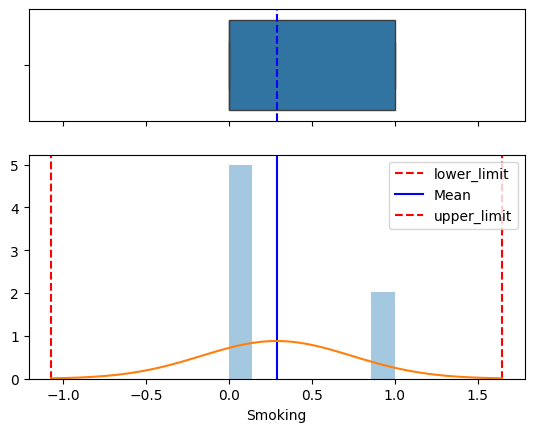

In [44]:
#Another way to calculate outlier on smoking feature:-


from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.5, 1)})

mean=data.Smoking.mean()
std = data.Smoking.std()
median = data.Smoking.median()
upper_limit = mean + std*3
lower_limit = mean - std*3
print("upper_limit : ", upper_limit)
print("lower_limit : ",lower_limit)

sns.boxplot(x=data["Smoking"], ax=ax_box)
ax_box.axvline(mean, color='b', linestyle='--')


sns.distplot(data["Smoking"], ax=ax_hist,kde=False,norm_hist=True)
ax_hist.axvline(lower_limit, color='r', linestyle='--')
ax_hist.axvline(mean, color='b', linestyle='-')
ax_hist.axvline(upper_limit, color='r', linestyle='--')



plt.legend({'Mean':mean})

ax_box.set(xlabel='')

x = np.linspace(mean - 3*std, mean + 3*std, 100)
plt.plot(x, norm.pdf(x, mean, std))
plt.legend({"lower_limit":lower_limit,'Mean':mean,'upper_limit':upper_limit})
print("Mean Value : ",mean)
print("Median Value : ",median)
print("1st Standard Deviation : ",std)

plt.show()

upper_limit :  3.6859169214283174
lower_limit :  -2.2908494481849484
Mean Value :  0.6975337366216845
Median Value :  0.0
1st Standard Deviation :  0.9961277282688776


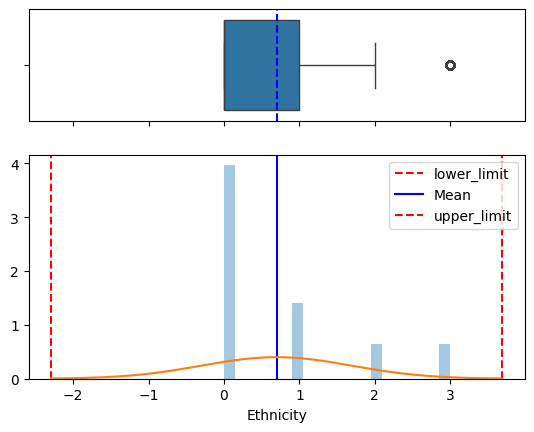

In [45]:
# check the outliers on Ethnicity feature : 

from scipy.stats import norm
import warnings
warnings.filterwarnings('ignore')

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw= {"height_ratios": (0.5, 1)})

mean=data.Ethnicity.mean()
std = data.Ethnicity.std()
median = data.Ethnicity.median()
upper_limit = mean + std*3
lower_limit = mean - std*3
print("upper_limit : ", upper_limit)
print("lower_limit : ",lower_limit)

sns.boxplot(x=data["Ethnicity"], ax=ax_box)
ax_box.axvline(mean, color='b', linestyle='--')


sns.distplot(data["Ethnicity"], ax=ax_hist,kde=False,norm_hist=True)
ax_hist.axvline(lower_limit, color='r', linestyle='--')
ax_hist.axvline(mean, color='b', linestyle='-')
ax_hist.axvline(upper_limit, color='r', linestyle='--')



plt.legend({'Mean':mean})

ax_box.set(xlabel='')

x = np.linspace(mean - 3*std, mean + 3*std, 100)
plt.plot(x, norm.pdf(x, mean, std))
plt.legend({"lower_limit":lower_limit,'Mean':mean,'upper_limit':upper_limit})
print("Mean Value : ",mean)
print("Median Value : ",median)
print("1st Standard Deviation : ",std)

plt.show()

In [46]:
# Handle the missing Values:
#1-check the missing values:

data.isnull().sum()

PatientID                    0
Age                          0
Gender                       0
Ethnicity                    0
EducationLevel               0
BMI                          0
Smoking                      0
AlcoholConsumption           0
PhysicalActivity             0
DietQuality                  0
SleepQuality                 0
FamilyHistoryAlzheimers      0
CardiovascularDisease        0
Diabetes                     0
Depression                   0
HeadInjury                   0
Hypertension                 0
SystolicBP                   0
DiastolicBP                  0
CholesterolTotal             0
CholesterolLDL               0
CholesterolHDL               0
CholesterolTriglycerides     0
MMSE                         0
FunctionalAssessment         0
MemoryComplaints             0
BehavioralProblems           0
ADL                          0
Confusion                    0
Disorientation               0
PersonalityChanges           0
DifficultyCompletingTasks    0
Forgetfu

In [47]:
# fill the null values 

# Load your dataset into a pandas dataframe
df = data

# Fill null values in numeric columns with the median of the column
numeric_cols = df.select_dtypes("number").columns
df[numeric_cols] = df[numeric_cols].fillna(df[numeric_cols].median())

# Fill null values in object columns with the mode of the column
object_cols = df.select_dtypes(include=['object']).columns
df[object_cols] = df[object_cols].fillna(df[object_cols].mode())


In [48]:
data.isna().mean()

PatientID                    0.0
Age                          0.0
Gender                       0.0
Ethnicity                    0.0
EducationLevel               0.0
BMI                          0.0
Smoking                      0.0
AlcoholConsumption           0.0
PhysicalActivity             0.0
DietQuality                  0.0
SleepQuality                 0.0
FamilyHistoryAlzheimers      0.0
CardiovascularDisease        0.0
Diabetes                     0.0
Depression                   0.0
HeadInjury                   0.0
Hypertension                 0.0
SystolicBP                   0.0
DiastolicBP                  0.0
CholesterolTotal             0.0
CholesterolLDL               0.0
CholesterolHDL               0.0
CholesterolTriglycerides     0.0
MMSE                         0.0
FunctionalAssessment         0.0
MemoryComplaints             0.0
BehavioralProblems           0.0
ADL                          0.0
Confusion                    0.0
Disorientation               0.0
Personalit

In [22]:
# Convert all Categorical columns into Numerical columns :
label_encoder=LabelEncoder()
for col in data.columns:
    data[col]=label_encoder.fit_transform(data[col])
data    

,PatientID,Age,Gender,Ethnicity,EducationLevel,BMI,Smoking,AlcoholConsumption,PhysicalActivity,DietQuality,...,MemoryComplaints,BehavioralProblems,ADL,Confusion,Disorientation,PersonalityChanges,DifficultyCompletingTasks,Forgetfulness,Diagnosis,DoctorInCharge
0,0,13,0,0,2,652,0,1418,1388,297,...,0,0,411,0,0,0,1,0,0,0
1,1,29,0,0,0,1003,0,472,1653,121,...,0,0,587,0,0,0,0,1,0,0
2,2,13,0,3,1,229,0,2100,1703,415,...,0,0,1507,0,1,0,1,0,0,0
3,3,14,1,0,1,1600,1,1314,1825,1589,...,0,1,1360,0,0,0,0,0,0,0
4,4,29,0,0,0,469,0,1974,1381,176,...,0,0,3,0,0,1,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2144,2144,1,0,0,1,2063,0,157,906,1393,...,0,0,960,1,0,0,0,0,1,0
2145,2145,15,0,0,2,236,0,2013,295,637,...,0,1,1983,0,0,0,0,0,1,0
2146,2146,17,0,0,1,52,0,477,2124,1753,...,0,0,1072,0,0,0,0,0,1,0
2147,2147,18,1,3,1,29,0,936,1395,276,...,0,0,814,0,0,0,0,1,1,0


In [23]:
# Devide the data :

x=data.drop(columns="Diagnosis",axis=1)
y=data["Diagnosis"]
print(np.shape(x),np.shape(y))

(2149, 34) (2149,)


In [24]:
#train the data:

x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.3,stratify=y,random_state=42)
print(np.shape(x_train),np.shape(x_test))
print(np.shape(y_train),np.shape(y_test))

(1504, 34) (645, 34)
(1504,) (645,)


In [52]:
RC1=RandomForestClassifier(random_state=42,n_jobs=-1,max_depth=5,n_estimators=100)
RC1.fit(x_train,y_train)

RandomForestClassifier(max_depth=5, n_jobs=-1, random_state=42)

In [53]:
RC1.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 5,
 'max_features': 'sqrt',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': -1,
 'oob_score': False,
 'random_state': 42,
 'verbose': 0,
 'warm_start': False}

In [54]:
#predict the model:

y_predict=RC1.predict(x_test)
y_predict[:10]

array([0, 0, 1, 0, 0, 0, 0, 0, 0, 0])

In [55]:
# compute the accuracy:
print(f"accuracy ---->>> {RC1.score(x_test,y_test)*100:0.2f}%")

accuracy ---->>> 87.29%


In [56]:
#improve from accuracy:
np.random.seed()
for i in range(10,110,10):
    print(f"at n_estimators= {i} n_estimators")
    RC2=RandomForestClassifier(n_estimators=i).fit(x_train,y_train)
    print(f"accuracy={RC2.score(x_test,y_test)*100:0.2f}%")

at n_estimators= 10 n_estimators
accuracy=91.63%
at n_estimators= 20 n_estimators
accuracy=89.77%
at n_estimators= 30 n_estimators
accuracy=92.25%
at n_estimators= 40 n_estimators
accuracy=93.49%
at n_estimators= 50 n_estimators
accuracy=92.40%
at n_estimators= 60 n_estimators
accuracy=92.40%
at n_estimators= 70 n_estimators
accuracy=93.80%
at n_estimators= 80 n_estimators
accuracy=94.11%
at n_estimators= 90 n_estimators
accuracy=93.64%
at n_estimators= 100 n_estimators
accuracy=93.64%


In [57]:
# Hypothesis  & Confusion_matrix :
cm=metrics.confusion_matrix(y_test,y_predict)
tp,tn,fp,fn= cm[1,1],cm[0,0],cm[0,1],cm[1,0]
print("True positve prediction :",tp)
print("True Negative predicion :",tn)
print("False positve prediction:",fp)
print("False Negative prediction:",fn)

print("*"*50)
print(f" precsion_score :{metrics.precision_score(y_test,y_predict)*100:0.2f}%")
print(f"recall_score:{metrics.recall_score(y_test,y_predict)*100:0.2f}%")

print("*"*50)

print(f" precsion_score :{metrics.precision_score(y_test,y_predict)*100:0.2f}%")
print(f"recall_score:{metrics.recall_score(y_test,y_predict)*100:0.2f}%")

print("*"*50)

# Report:
class_report = classification_report(y_test, y_predict)
print("Classification Report:\n", class_report)


True positve prediction : 153
True Negative predicion : 410
False positve prediction: 7
False Negative prediction: 75
**************************************************
 precsion_score :95.62%
recall_score:67.11%
**************************************************
 precsion_score :95.62%
recall_score:67.11%
**************************************************
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.98      0.91       417
           1       0.96      0.67      0.79       228

    accuracy                           0.87       645
   macro avg       0.90      0.83      0.85       645
weighted avg       0.88      0.87      0.87       645



In [58]:
# Build DecisionTree Model:
DT=tree.DecisionTreeClassifier(random_state=42,max_depth=5)
DT.fit(x_train,y_train)

DecisionTreeClassifier(max_depth=5, random_state=42)

In [59]:
DT.get_params()

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'gini',
 'max_depth': 5,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'random_state': 42,
 'splitter': 'best'}

In [60]:
y_predic=DT.predict(x_test)
y_predic[:10]

array([0, 0, 1, 0, 0, 1, 0, 1, 1, 0])

In [61]:
# compute the accuracy:
print(f"accuracy ---->>> {DT.score(x_test,y_test)*100:0.2f}%")

accuracy ---->>> 93.95%


In [62]:
# explain the prediction:
tree_represention=tree.export_text(DT)
print(tree_represention)

|--- feature_24 <= 1040.50
|   |--- feature_23 <= 1736.50
|   |   |--- feature_27 <= 1095.50
|   |   |   |--- feature_0 <= 1983.00
|   |   |   |   |--- feature_27 <= 1078.00
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_27 >  1078.00
|   |   |   |   |   |--- class: 0
|   |   |   |--- feature_0 >  1983.00
|   |   |   |   |--- feature_18 <= 29.00
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_18 >  29.00
|   |   |   |   |   |--- class: 1
|   |   |--- feature_27 >  1095.50
|   |   |   |--- feature_25 <= 0.50
|   |   |   |   |--- feature_26 <= 0.50
|   |   |   |   |   |--- class: 0
|   |   |   |   |--- feature_26 >  0.50
|   |   |   |   |   |--- class: 1
|   |   |   |--- feature_25 >  0.50
|   |   |   |   |--- feature_10 <= 1877.50
|   |   |   |   |   |--- class: 1
|   |   |   |   |--- feature_10 >  1877.50
|   |   |   |   |   |--- class: 1
|   |--- feature_23 >  1736.50
|   |   |--- feature_0 <= 1976.50
|   |   |   |--- feature_22 <= 1820.00
|   |   |   | 

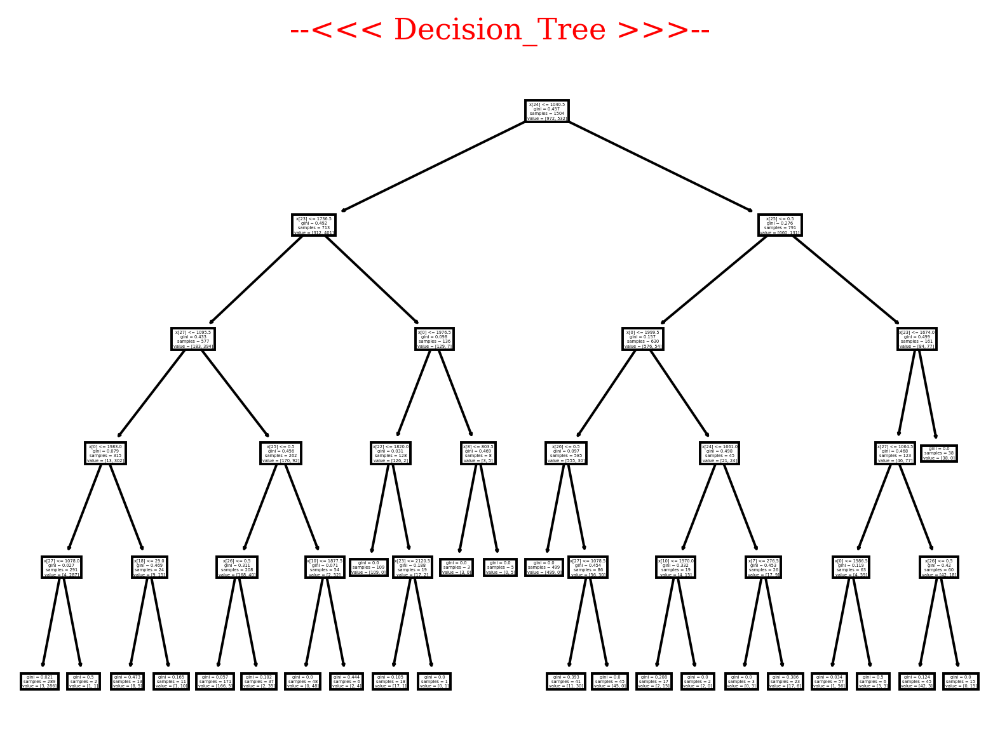

In [63]:
#plot the tree :

# if i want to plot tree:

f={"color":"r","family":"serif","size":12}
plt.figure(figsize=(7,5),dpi=280) 
tree.plot_tree(DT)
plt.title("--<<< Decision_Tree >>>--",fontdict=f)
plt.show()

In [64]:
# Build svm Model :
SV=svm.SVC(random_state=42,kernel="linear" )
SV.fit(x_train,y_train)


SVC(kernel='linear', random_state=42)

In [65]:
y_pred=SV.predict(x_test)
y_pred[:10]

array([0, 0, 1, 1, 0, 1, 0, 0, 0, 0])

In [66]:
#Evalute the model:
print("Errot Precentage --->>",metrics.mean_squared_error(y_test,y_pred)*100)
print("accuracy --->>>",SV.score(x_test,y_test)*100)

Errot Precentage --->> 15.658914728682172
accuracy --->>> 84.34108527131782


In [67]:
#Evaluation Model (matrices):

print(f"accuracy:{metrics.accuracy_score(y_test,y_pred)*100:0.2f}%")

print("*"*50)

cm=metrics.confusion_matrix(y_test,y_pred)
tp,tn,fp,fn= cm[1,1],cm[0,0],cm[0,1],cm[1,0]

print("True positve prediction :",tp)
print("True Negative predicion :",tn)
print("False positve prediction:",fp)
print("False Negative prediction:",fn)

print("*"*50)

print(f" precsion_score :{metrics.precision_score(y_test,y_pred)*100:0.2f}%")
print(f"recall_score:{metrics.recall_score(y_test,y_pred)*100:0.2f}%")

print("*"*50)

class_report=classification_report(y_test, y_pred)
print("Classification_report --->> \n",class_report)


accuracy:84.34%
**************************************************
True positve prediction : 170
True Negative predicion : 374
False positve prediction: 43
False Negative prediction: 58
**************************************************
 precsion_score :79.81%
recall_score:74.56%
**************************************************
Classification_report --->> 
               precision    recall  f1-score   support

           0       0.87      0.90      0.88       417
           1       0.80      0.75      0.77       228

    accuracy                           0.84       645
   macro avg       0.83      0.82      0.83       645
weighted avg       0.84      0.84      0.84       645



Build Model BY using tensorflow 

In [25]:
# imports :
import tensorflow as tf 
from tensorflow.keras import Sequential 
from tensorflow.keras.layers import Dense,Input
from tensorflow.keras.losses import BinaryCrossentropy


In [26]:
# Build the model:

model=Sequential([
    Input(shape=[34]),
    Dense(units=35,activation="relu"),
    Dense(units=15,activation="relu"),
    Dense(units=1,activation="sigmoid")
])
model

In [27]:
#compile:
model.compile(
    loss=BinaryCrossentropy(from_logits=True),
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.001),
    metrics=[tf.metrics.BinaryAccuracy()],
  )

In [28]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_3 (Dense)             (None, 35)                1225      
                                                                 
 dense_4 (Dense)             (None, 15)                540       
                                                                 
 dense_5 (Dense)             (None, 1)                 16        
                                                                 
Total params: 1781 (6.96 KB)
Trainable params: 1781 (6.96 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [29]:
#fit the model:
model.fit(x_train,y_train,epochs=100,batch_size=35,validation_split=0.1)

Epoch 1/100


/home/abdalrahman/.local/lib/python3.8/site-packages/keras/src/backend.py:5805: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


39/39 [==============================] - 0s 3ms/step - loss: 60.5045 - binary_accuracy: 0.5898 - val_loss: 33.0664 - val_binary_accuracy: 0.6093
Epoch 2/100
39/39 [==============================] - 0s 1ms/step - loss: 32.6480 - binary_accuracy: 0.6497 - val_loss: 26.6040 - val_binary_accuracy: 0.6358
Epoch 3/100
39/39 [==============================] - 0s 972us/step - loss: 23.9593 - binary_accuracy: 0.6608 - val_loss: 19.8662 - val_binary_accuracy: 0.6755
Epoch 4/100
39/39 [==============================] - 0s 939us/step - loss: 18.4169 - binary_accuracy: 0.6837 - val_loss: 15.4018 - val_binary_accuracy: 0.6755
Epoch 5/100
39/39 [==============================] - 0s 947us/step - loss: 14.9068 - binary_accuracy: 0.6866 - val_loss: 13.5212 - val_binary_accuracy: 0.7417
Epoch 6/100
 1/39 [..............................] - ETA: 0s - loss: 5.5157 - binary_accuracy: 0.8857

/home/abdalrahman/.local/lib/python3.8/site-packages/keras/src/backend.py:5805: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


39/39 [==============================] - 0s 976us/step - loss: 12.6725 - binary_accuracy: 0.6992 - val_loss: 11.3806 - val_binary_accuracy: 0.7152
Epoch 7/100
39/39 [==============================] - 0s 948us/step - loss: 11.1224 - binary_accuracy: 0.7036 - val_loss: 10.6043 - val_binary_accuracy: 0.6623
Epoch 8/100
39/39 [==============================] - 0s 938us/step - loss: 8.8801 - binary_accuracy: 0.7029 - val_loss: 8.3543 - val_binary_accuracy: 0.7483
Epoch 9/100
39/39 [==============================] - 0s 948us/step - loss: 7.9779 - binary_accuracy: 0.7066 - val_loss: 8.5574 - val_binary_accuracy: 0.6821
Epoch 10/100
39/39 [==============================] - 0s 977us/step - loss: 7.2357 - binary_accuracy: 0.6918 - val_loss: 5.8889 - val_binary_accuracy: 0.7483
Epoch 11/100
39/39 [==============================] - 0s 929us/step - loss: 6.2513 - binary_accuracy: 0.7147 - val_loss: 5.4891 - val_binary_accuracy: 0.7219
Epoch 12/100
39/39 [==============================] - 0s 953us/s

In [30]:
# predict on the model:
y_predction=model.predict(x_test)
y_predction[:10]

21/21 [==============================] - 0s 562us/step


array([[4.6714490e-08],
       [9.8020552e-09],
       [9.0524125e-01],
       [9.9992144e-01],
       [3.0266523e-02],
       [8.3806068e-02],
       [2.3686569e-06],
       [5.8880800e-01],
       [4.7055021e-08],
       [3.2996499e-09]], dtype=float32)

In [31]:
# compute min & max in the y_prediction:
print(f"the min_value for prediction --->> {np.min(y_predction)} \n the max_value for prediction --->>> {np.max(y_predction)} ")

the min_value for prediction --->> 0.0 
 the max_value for prediction --->>> 1.0 


In [32]:
# the Description of the model:
model.history.history

{}

In [76]:
print(""" 
       --->> Here is the End of the Code <<------
       --->> Devloper: AbdalRahman Gameel Ahmed Hebishy  

                  """)

 
       --->> Here is the End of the Code <<------
       --->> Devloper: AbdalRahman Gameel Ahmed Hebishy  

                  
